<a href="https://colab.research.google.com/github/Daniel-ASG/Projetos/blob/main/House_Rocket_Company.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# A Questão de Negócio

A House Rocket é uma plataforma digital (fictícia) que tem como modelo de negócio, a compra e a venda de imóveis usando tecnologia.

A empresa deseja encontrar as melhores oportunidades de negócio no mercado de imóveis. O CEO da House Rocket gostaria de maximizar a receita da empresa encontrando boas oportunidades de negócio.

A principal estratégia é comprar boas casas em ótimas localizações com preços baixos e depois revendê-las a preços mais altos. Quanto maior a diferença entre a compra e a venda, maior o lucro da empresa e portanto maior sua receita.

Entretanto, as casas possuem muitos atributos que as tornam mais ou menos atrativas aos compradores e vendedores. A localização e o período do ano também podem influenciar os preços.



# O Entendimento do Negócio

1. Quais casas o CEO da House Rocket deveria comprar e por qual preço de compra?
2. Uma vez a casa em posse da empresa, qual o melhor momento para vendê-las e qual seria o preço da venda?
3. A House Rocket deveria fazer uma reforma para aumentar o preço da venda? Quais seriam as sugestões de mudanças? Qual o incremento no preço dado por cada opção de reforma?

# A Coleta de Dados

O conjunto de dados que representam o contexto está disponível na plataforma do Kaggle.
Esse é o link: https://www.kaggle.com/harlfoxem/housesalesprediction

Esse conjunto de dados contém casas vendidas entre Maio de 2014 e Maio de 2015. 

## Update
 Para baixar o dataset, podemos fazer isso diretamente do Kaggle, por meio de uma API própria que eles disponibilizam.

 Installing the [Kaggle API](https://github.com/Kaggle/kaggle-api) in Colab


In [ ]:
!pip install kaggle

###Authenticating with Kaggle using kaggle.json

Navigate to https://www.kaggle.com. Then go to the [Account tab of your user profile](https://www.kaggle.com/me/account) and select Create API Token. This will trigger the download of kaggle.json, a file containing your API credentials.

Then run the cell below to upload kaggle.json to your Colab runtime.

In [ ]:
from google.colab import files

uploaded = files.upload()

for fn in uploaded.keys():
  print(f'O usuário carregou arquivo "{fn}" com tamanho de {len(uploaded[fn])} bytes')
  
# Then move kaggle.json into the folder where the API expects to find it.
!mkdir -p ~/.kaggle/ && mv kaggle.json ~/.kaggle/ && chmod 600 ~/.kaggle/kaggle.json

Saving kaggle.json to kaggle.json
O usuário carregou arquivo "kaggle.json" com tamanho de 73 bytes


Baixando o dataset

In [ ]:
!kaggle datasets download "harlfoxem/housesalesprediction"
!unzip housesalesprediction.zip

  0% 0.00/780k [00:00<?, ?B/s]
100% 780k/780k [00:00<00:00, 52.8MB/s]
Archive:  housesalesprediction.zip
  inflating: kc_house_data.csv       


In [ ]:
import pandas as pd 

dados = pd.read_csv("/content/kc_house_data.csv")
dados.head(10)

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,20141013T000000,221900.0,3,1.00,1180,5650,1.0,0,0,3,7,1180,0,1955,0,98178,47.5112,-122.257,1340,5650
1,6414100192,20141209T000000,538000.0,3,2.25,2570,7242,2.0,0,0,3,7,2170,400,1951,1991,98125,47.7210,-122.319,1690,7639
2,5631500400,20150225T000000,180000.0,2,1.00,770,10000,1.0,0,0,3,6,770,0,1933,0,98028,47.7379,-122.233,2720,8062
3,2487200875,20141209T000000,604000.0,4,3.00,1960,5000,1.0,0,0,5,7,1050,910,1965,0,98136,47.5208,-122.393,1360,5000
4,1954400510,20150218T000000,510000.0,3,2.00,1680,8080,1.0,0,0,3,8,1680,0,1987,0,98074,47.6168,-122.045,1800,7503
5,7237550310,20140512T000000,1225000.0,4,4.50,5420,101930,1.0,0,0,3,11,3890,1530,2001,0,98053,47.6561,-122.005,4760,101930
6,1321400060,20140627T000000,257500.0,3,2.25,1715,6819,2.0,0,0,3,7,1715,0,1995,0,98003,47.3097,-122.327,2238,6819
7,2008000270,20150115T000000,291850.0,3,1.50,1060,9711,1.0,0,0,3,7,1060,0,1963,0,98198,47.4095,-122.315,1650,9711
8,2414600126,20150415T000000,229500.0,3,1.00,1780,7470,1.0,0,0,3,7,1050,730,1960,0,98146,47.5123,-122.337,1780,8113
9,3793500160,20150312T000000,323000.0,3,2.50,1890,6560,2.0,0,0,3,7,1890,0,2003,0,98038,47.3684,-122.031,2390,7570


In [ ]:
dados.shape

(21613, 21)

| Dicionário das variáveis |                                                                                                                                                                                                      |
|:------------------------:|------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------|
|            id            | Unique ID for each home sold                                                                                                                                                                         |
|           date           | Date of the home sale                                                                                                                                                                                |
|           price          | Price of each home sold                                                                                                                                                                              |
|         bedrooms         | Number of bedroom                                                                                                                                                                                    |
|         bathrooms        | Number of bathrooms, where .5 accounts for a room with a toilet but no shower                                                                                                                        |
|        sqft_living       | Square footage of the apartments interior living space                                                                                                                                               |
|         sqft_lot         | Square footage of the land space                                                                                                                                                                     |
|          floors          | Number of floors                                                                                                                                                                                     |
|        waterfront        | A dummy variable for whether the apartment was overlooking the waterfront or not                                                                                                                     |
|           view           | An index from 0 to 4 of how good the view of the property was                                                                                                                                        |
|         condition        | An index from 1 to 5 on the condition of the apartment,                                                                                                                                              |
|           grade          | An index from 1 to 13, where 1-3 falls short of building construction and design, 7 has an average level of construction and design, and 11-13 have a high quality level of construction and design. |
|        sqft_above        | The square footage of the interior housing space that is above ground level                                                                                                                          |
|       sqft_basement      | The square footage of the interior housing space that is below ground level                                                                                                                          |
|         yr_built         | The year the house was initially built                                                                                                                                                               |
|       yr_renovated       | The year of the house’s last renovation                                                                                                                                                              |
|          zipcode         | What zipcode area the house is in                                                                                                                                                                    |
|            lat           | Lattitude                                                                                                                                                                                            |
|           long           | Longitude                                                                                                                                                                                            |
|       sqft_living15      | The square footage of interior housing living space for the nearest 15 neighbors                                                                                                                     |
|        sqft_lot15        | The square footage of the land lots of the nearest 15 neighbors                                                                                                                                      |




> Fonte: <https://www.kaggle.com/harlfoxem/housesaleprediction/discussion/207885>




# A Limpeza de Dados

In [ ]:
# Verificar informações sobre o Dataset e se há dados ausentes

dados.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21613 entries, 0 to 21612
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             21613 non-null  int64  
 1   date           21613 non-null  object 
 2   price          21613 non-null  float64
 3   bedrooms       21613 non-null  int64  
 4   bathrooms      21613 non-null  float64
 5   sqft_living    21613 non-null  int64  
 6   sqft_lot       21613 non-null  int64  
 7   floors         21613 non-null  float64
 8   waterfront     21613 non-null  int64  
 9   view           21613 non-null  int64  
 10  condition      21613 non-null  int64  
 11  grade          21613 non-null  int64  
 12  sqft_above     21613 non-null  int64  
 13  sqft_basement  21613 non-null  int64  
 14  yr_built       21613 non-null  int64  
 15  yr_renovated   21613 non-null  int64  
 16  zipcode        21613 non-null  int64  
 17  lat            21613 non-null  float64
 18  long  

In [ ]:
# Faz a mesma verificação acima, de uma maneira diferente

dados.isnull().sum().sort_values(ascending=False)

sqft_lot15       0
view             0
date             0
price            0
bedrooms         0
bathrooms        0
sqft_living      0
sqft_lot         0
floors           0
waterfront       0
condition        0
sqft_living15    0
grade            0
sqft_above       0
sqft_basement    0
yr_built         0
yr_renovated     0
zipcode          0
lat              0
long             0
id               0
dtype: int64

In [ ]:
dados.describe().T[['mean', 'std', 'min', 'max']]

,mean,std,min,max
id,4.580302e+09,2.876566e+09,1.000102e+06,9.900000e+09
price,5.400881e+05,3.671272e+05,7.500000e+04,7.700000e+06
bedrooms,3.370842e+00,9.300618e-01,0.000000e+00,3.300000e+01
bathrooms,2.114757e+00,7.701632e-01,0.000000e+00,8.000000e+00
sqft_living,2.079900e+03,9.184409e+02,2.900000e+02,1.354000e+04
sqft_lot,1.510697e+04,4.142051e+04,5.200000e+02,1.651359e+06
floors,1.494309e+00,5.399889e-01,1.000000e+00,3.500000e+00
waterfront,7.541757e-03,8.651720e-02,0.000000e+00,1.000000e+00
view,2.343034e-01,7.663176e-01,0.000000e+00,4.000000e+00
condition,3.409430e+00,6.507430e-01,1.000000e+00,5.000000e+00


In [ ]:
# listando features categoricas e numéricas:
variaveis_categoricas = list(dados.select_dtypes(include=['object']).columns)
variaveis_numericas = list(dados.select_dtypes(include=['float64', 'int64']).columns)
print('variaveis_categoricas:', variaveis_categoricas)
print('variaveis_numericas:', variaveis_numericas)

variaveis_categoricas: ['date']
variaveis_numericas: ['id', 'price', 'bedrooms', 'bathrooms', 'sqft_living', 'sqft_lot', 'floors', 'waterfront', 'view', 'condition', 'grade', 'sqft_above', 'sqft_basement', 'yr_built', 'yr_renovated', 'zipcode', 'lat', 'long', 'sqft_living15', 'sqft_lot15']


# **Aula #01 do Curso de Python do ZERO ao DS**

## De início o CEO tem algumas perguntas que ele gostaria que fossem respondidas:

1. <font color='green'>Quantas casas estão disponíveis para compra?</font>
2. <font color='green'>Quantos atributos as casa possuem ( Tamanho, preço, m2, quartos, … )?</font>
3. <font color='green'>Quais são os atributos para a casa?</font>
4. <font color='green'>Qual a casa disponível é a mais cara ( casa de maior valor de venda )?</font>
5. <font color='green'>Qual a casa com o maior número de quartos?</font>

In [ ]:
# 1.Quantas casas estão disponíveis para compra?
#   Para encontrar esta resposta basta verificar a quantidade de observações no dataset, ou seja, a quantidade de linhas.
print('1.Quantas casas estão disponíveis para compra?')
casas_disponiveis = dados.shape[0]
print(f'  {casas_disponiveis} unidades.\n\n')


# 2.Quantos atributos as casa possuem ( Tamanho, preço, m2, quartos, … )?
#   Para encontrar esta resposta basta verificar a quantidade de colunas no dataset.
print('2.Quantos atributos as casa possuem ( Tamanho, preço, m2, quartos, … )?')
quant_atributos = dados.shape[1]
print(f'  {quant_atributos} atributos.\n\n')


# 3.Quais são os atributos para a casa?
#   Os atributos de cada imóvel podem ser conhecidos ao obtermos os nomes das colunas do dataset.
print('3.Quais são os atributos para a casa?')
print(f'  {dados.columns}\n\n\n')


# 4.Qual é a casa disponível mais cara ( casa de maior valor de venda )?
#   Para esta resposta é necessário observar a coluna 'price' e encotrar o maior valor.
print('4.Qual é a casa disponível mais cara ( casa de maior valor de venda )?')
display(dados.query('price == price.max()'))


# 5.Qual a casa com o maior número de quartos?
#   É necessário observar a coluna 'bedrooms' e encontrar o maior valor.
print('\n\n\n5.Qual a casa com o maior número de quartos?')
display(dados.query('bedrooms == bedrooms.max()'))

1.Quantas casas estão disponíveis para compra?
  21613 unidades.


2.Quantos atributos as casa possuem ( Tamanho, preço, m2, quartos, … )?
  21 atributos.


3.Quais são os atributos para a casa?
  Index(['id', 'date', 'price', 'bedrooms', 'bathrooms', 'sqft_living',
       'sqft_lot', 'floors', 'waterfront', 'view', 'condition', 'grade',
       'sqft_above', 'sqft_basement', 'yr_built', 'yr_renovated', 'zipcode',
       'lat', 'long', 'sqft_living15', 'sqft_lot15'],
      dtype='object')



4.Qual é a casa disponível mais cara ( casa de maior valor de venda )?


,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
7252,6762700020,20141013T000000,7700000.0,6,8.0,12050,27600,2.5,0,3,4,13,8570,3480,1910,1987,98102,47.6298,-122.323,3940,8800





5.Qual a casa com o maior número de quartos?


,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
15870,2402100895,20140625T000000,640000.0,33,1.75,1620,6000,1.0,0,0,5,7,1040,580,1947,0,98103,47.6878,-122.331,1330,4700


##Algumas perguntas extra.

In [ ]:
# 6.Qual a soma total de quartos do conjunto de dados?
print('6.Qual a soma total de quartos do conjunto de dados?')
print(f'  {dados.bedrooms.sum()} quartos.\n\n')


# 7.Quantas casas possuem 2 banheiros?
print('7.Quantas casas possuem 2 banheiros?')
print(f'  {dados.query("bathrooms == 2").shape[0]} casas.\n\n')


# 8.Qual o preço médio de todas as casas no conjunto de dados?
print('8.Qual o preço médio de todas as casas no conjunto de dados?')
print(f'  Preço médio = ${dados.price.mean():.2f}\n\n')


# 9.Qual o preço médio de casas com 2 banheiros?
print('9.Qual o preço médio de casas com 2 banheiros?')
media = dados.query('bathrooms == 2').price.mean()
print(f'  Preço médio = ${media:.2f}\n\n')


# 10.Qual o preço mínimo entre as casas com 3 quartos?
print('10.Qual o preço mínimo entre as casas com 3 quartos?')
minimo = dados.query('bedrooms == 3').price.min()
print(f'  Preço mínimo = ${minimo}\n\n')


# 11.Quantas casas possuem mais de 300 metros quadrados na sala de estar?
print('11.Quantas casas possuem mais de 300m² na sala de estar?')
dados['m2_living'] = dados.sqft_living*0.092903
print(f'   {dados.query("m2_living > 300").shape[0]} casas.\n\n')


# 12.Quantas casas tem mais de 2 andares?
print('12.Quantas casas tem mais de 2 andares?')
print(f'   {dados.query("floors > 2").shape[0]} casas.\n\n')


# 13.Quantas casas tem vista para o mar?
print('13.Quantas casas tem vista para o mar?')
print(f'   {dados.query("waterfront == True").shape[0]} casas.\n\n')


# 14.Das casas com vista para o mar, quantas tem 3 quartos?
print('14.Das casas com vista para o mar, quantas tem 3 quartos?')
print(f'   {dados.query("waterfront == True & bedrooms == 3").shape[0]} casas.\n\n')


# 15.Das casas com mais de 300 metros quadrados de sala de estar, quantas tem mais de 2 banheiros?
print('15.Das casas com mais de 300 metros quadrados de sala de estar, quantas tem mais de 2 banheiros?')
print(f'   {dados.query("m2_living > 300 & bathrooms > 2").shape[0]} casas.\n\n')

6.Qual a soma total de quartos do conjunto de dados?
  72854 quartos.


7.Quantas casas possuem 2 banheiros?
  1930 casas.


8.Qual o preço médio de todas as casas no conjunto de dados?
  Preço médio = $540088.14


9.Qual o preço médio de casas com 2 banheiros?
  Preço médio = $457889.72


10.Qual o preço mínimo entre as casas com 3 quartos?
  Preço mínimo = $82000.0


11.Quantas casas possuem mais de 300m² na sala de estar?
   2258 casas.


12.Quantas casas tem mais de 2 andares?
   782 casas.


13.Quantas casas tem vista para o mar?
   163 casas.


14.Das casas com vista para o mar, quantas tem 3 quartos?
   64 casas.


15.Das casas com mais de 300 metros quadrados de sala de estar, quantas tem mais de 2 banheiros?
   2201 casas.




# **Aula #02 do Curso de Python do ZERO ao DS**

## Novas perguntas do CEO
1. Qual a data do imóvel mais antigo no portfólio?
2. Quantos imóveis possuem o número máximo de andares?
3. Criar uma classificação para os imóveis, separando-os em baixo e alto padrão, de acordo com preço.
    - Acima de 540.000 -> alto padrão
    - Abaixo de 540.000 -> baixo padrão
4.  Gostaria de um relatório ordenado pelo preço e contento as seguintes informações:
    * id do imóvel
    * data que o imóvel ficou disponível para compra
    * número de quartos
    * tamanho total to terreno
    * preço
    * classificação do imóvel ( alto e baixo padrão )
5. Gostaria de um Mapa indicando onde as casas estão localizadas geograficamente.

In [ ]:
dados = pd.read_csv("/content/kc_house_data.csv")

# 1.Qual a data do imóvel mais antigo no portfólio?
#   Selecionamos a coluna 'date' e pegamos o menor.
print('1.Qual a data do imóvel mais antigo no portfólio?')
dados.date = pd.to_datetime(dados.date, errors='coerce')
data_antigo = dados.date.min()
print(f'  {data_antigo.year}'+'-'+f'{data_antigo.month}'+'-'+f'{data_antigo.day}\n\n')


# 2.Quantos imóveis possuem o número máximo de andares?
print('2.Quantos imóveis possuem o número máximo de andares?')
quantidade = dados.query('floors == floors.max()').shape[0]
print(f'  {quantidade} imóveis.\n\n')


# 3.Criar uma classificação para os imóveis, separando-os em baixo e alto padrão
#       * Criar uma nova coluna no conjunto de dados chamada “standard”
#       * Para cada linha, eu vou comparar a coluna “price”
#       * Se “price” for maior que 540.000, eu vou escrever “high_standard” na coluna “standard”
#       * Se “price” for menor que 540.000, eu vou escrever “low_standard” na coluna “standard”
print('3.Criar uma classificação para os imóveis, separando-os em baixo e alto padrão')
dados['level'] = dados.price.apply(lambda x: 'low_level' if x<540000 else 'high_level')
display(dados[['id', 'price', 'level']].head(8))


# 4.Gostaria de um relatório ordenado pelo preço e contento as seguintes informações:
#       * id do imóvel
#       * data que o imóvel ficou disponível para compra
#       * número de quartos
#       * tamanho total to terreno
#       * preço
#       * classificação do imóvel ( alto e baixo padrão )
print('\n\n\n4.Gostaria de um relatório ordenado pelo preço e contento as seguintes informações:'+
      '\n      * id do imóvel'+
      '\n      * data que o imóvel ficou disponível para compra'+
      '\n      * número de quartos'+
      '\n      * tamanho total to terreno'+
      '\n      * preço'+
      '\n      * classificação do imóvel ( alto e baixo padrão )')
relatorio = dados[['id', 'date', 'bedrooms', 'sqft_lot', 'price', 'level']].sort_values(by='price', ascending=False)
relatorio.to_csv('relatorio.csv', index=False)
print('  relatorio.csv criado com sucesso!\n\n')



# 5.Gostaria de um Mapa indicando onde as casas estão localizadas geograficamente.
print('5.Gostaria de um Mapa indicando onde as casas estão localizadas geograficamente.')
import plotly.express as px
data_mapa = dados[['id', 'lat', 'long', 'price']]
mapa = px.scatter_mapbox(data_mapa, lat='lat', lon='long',
                         hover_name='id',
                         hover_data=['price'],
                         color_discrete_sequence=['fuchsia'],
                         zoom=8.3, height=300)
mapa.update_layout(mapbox_style='open-street-map')
mapa.update_layout(height=600, margin={'r':0, 't':0, 'l':0, 'b':0})
print('  mapa_house_rocket.html gerado com Sucesso!')
mapa.show()
mapa.write_html('/content/mapa_house_rocket.html')

1.Qual a data do imóvel mais antigo no portfólio?
  2014-5-2


2.Quantos imóveis possuem o número máximo de andares?
  8 imóveis.


3.Criar uma classificação para os imóveis, separando-os em baixo e alto padrão


,id,price,level
0,7129300520,221900.0,low_level
1,6414100192,538000.0,low_level
2,5631500400,180000.0,low_level
3,2487200875,604000.0,high_level
4,1954400510,510000.0,low_level
5,7237550310,1225000.0,high_level
6,1321400060,257500.0,low_level
7,2008000270,291850.0,low_level





4.Gostaria de um relatório ordenado pelo preço e contento as seguintes informações:
      * id do imóvel
      * data que o imóvel ficou disponível para compra
      * número de quartos
      * tamanho total to terreno
      * preço
      * classificação do imóvel ( alto e baixo padrão )
  relatorio.csv criado com sucesso!


5.Gostaria de um Mapa indicando onde as casas estão localizadas geograficamente.
  mapa_house_rocket.html gerado com Sucesso!


##Algumas questões extra.

In [ ]:
# 1.Crie uma nova coluna chamada: “house_age”
#         * Se o valor da coluna “date” for maior que 2014-01-01 => ‘new_house’
#         * Se o valor da coluna “date” for menor que 2014-01-01 => ‘old_house’
print('1.Crie uma nova coluna chamada: “house_age”'+
      '\n        * Se o valor da coluna “date” for maior que 2014-01-01 => ‘new_house’'+
      '\n        * Se o valor da coluna “date” for menor que 2014-01-01 => ‘old_house’')
print(f'  {dados.date.min()}')
print('  Como a data mais antiga é 2014-05-02 não faz sentido criar uma nova coluna com todos valores iguais a "house_age".\n\n')


# 2.Crie uma nova coluna chamada: “dormitory_type”
#         * Se o valor da coluna “bedrooms” for igual à 1 => ‘studio’
#         * Se o valor da coluna “bedrooms” for igual a 2 => ‘apartament’
#         * Se o valor da coluna “bedrooms” for maior que 2 => ‘house’
print('2.Crie uma nova coluna chamada: “dormitory_type”'+
      '\n        * Se o valor da coluna “bedrooms” for igual à 1 => ‘studio’'+
      '\n        * Se o valor da coluna “bedrooms” for igual a 2 => ‘apartament’'+
      '\n        * Se o valor da coluna “bedrooms” for maior que 2 => ‘house’')
dados['dormitory_type'] = dados.bedrooms.apply(lambda x: 'studio' if x==1 else 
                                                        ('apartament' if x==2 else 
                                                        ('house' if x>2 else 
                                                         'no_bedrooms')))
display(dados.sample(10))


# 3.Crie uma nova coluna chamada: “condition_type”
#         * Se o valor da coluna “condition” for menor ou igual à 2 => ‘bad’
#         * Se o valor da coluna “condition” for igual à 3 ou 4 => ‘regular’
#         * Se o valor da coluna “condition” for igual à 5 => ‘good’
print('\n\n\n3.Crie uma nova coluna chamada: “condition_type”'+
      '\n        * Se o valor da coluna “condition” for menor ou igual à 2 => ‘bad’'+
      '\n        * Se o valor da coluna “condition” for igual à 3 ou 4 => ‘regular’'+
      '\n        * Se o valor da coluna “condition” for igual à 5 => ‘good’')
dados['condition_type'] = dados.condition.apply(lambda x: 'bad' if x<=2 else 
                                                         ('good' if x>=5 else 
                                                          'regular'))
display(dados.sample(10))


# 4.Modifique o TIPO a Coluna “condition” para STRING
print('\n\n\n4.Modifique o TIPO a Coluna “condition” para STRING')
print(dados.condition.dtype)


# 5.Delete as colunas: “sqft_living15” e “sqft_lot15”
print('\n\n5.Delete as colunas: “sqft_living15” e “sqft_lot15”')
dados.drop(['sqft_living15', 'sqft_lot15'], axis=1, inplace=True)
print(dados.columns)


# 6.Modifique o TIPO da Coluna “yr_built” para DATE
print('\n\n6.Modifique o TIPO da Coluna “yr_built” para DATE')
dados['yr_built'] = pd.to_datetime(dados.yr_built, format='%Y', errors= 'coerce')
display(dados.head())


# 7.Modifique o TIPO da Coluna “yr_renovated” para DATE
print('\n\n\n7.Modifique o TIPO da Coluna “yr_renovated” para DATE')
dados.yr_renovated = pd.to_datetime(dados.yr_renovated, format='%Y', errors= 'coerce')
display(dados.head())


# 8.Qual a data mais antiga de construção de um imóvel?
print('\n\n\n8.Qual a data mais antiga de construção de um imóvel?')
print(f'  {dados["yr_built"].dt.year.min():.0f}')


# 9.Qual a data mais antiga de renovação de um imóvel?
print('\n\n9.Qual a data mais antiga de renovação de um imóvel?')
print(f'  {dados["yr_renovated"].dt.year.min():.0f}')


# 10.Quantos imóveis tem 2 andares?
print('\n\n10.Quantos imóveis tem 2 andares?')
print(f'   {dados.query("floors == 2").shape[0]} imóveis')


# 11.Quantos imóveis estão com a condição igual a “regular” ?
print('\n\n11.Quantos imóveis estão com a condição igual a “regular” ?')
quantidade = dados.query('condition_type == "regular"').shape[0]
print(f'   {quantidade} imóveis')


# 12.Quantos imóveis estão com a condição igual a “bad” e possuem “vista para água” ?
print('\n\n12.Quantos imóveis estão com a condição igual a “bad” e possuem “vista para água” ?')
quantidade = dados.query('condition_type == "bad" & waterfront == 1').shape[0]
print(f'   {quantidade} imóveis')


# 13.Quantos imóveis estão com a condição igual a “good” e são “new_house”?
print('\n\n13.Quantos imóveis estão com a condição igual a “good” e são “new_house”?')
quantidade = dados.query('condition_type == "good"').shape[0]
print(f'   {quantidade} imóveis')


# 14.Qual o valor do imóvel mais caro do tipo “studio” ?
print('\n\n14.Qual o valor do imóvel mais caro do tipo “studio” ?')
valor = dados.query('dormitory_type == "studio"')['price'].max()
print(f'   ${valor:.2f}')


# 15.Quantos imóveis do tipo “apartment” foram reformados em 2015 ?
print('\n\n15.Quantos imóveis do tipo “apartment” foram reformados em 2015 ?')
quantidade = dados.loc[(dados.dormitory_type == 'apartment') & (dados["yr_renovated"].dt.year == 2015)].shape[0]
print(f'   {quantidade} imóveis')


# 16.Qual o maior número de quartos que imóveis do tipo “house” possui ?
print('\n\n16.Qual o maior número de quartos que imóveis do tipo “house” possui ?')
quantidade = dados.query('dormitory_type == "house"')['bedrooms'].max()
print(f'   {quantidade} quartos.')


# 17.Quantos imóveis “new_house” foram reformados no ano de 2014?
print('\n\n17.Quantos imóveis “new_house” foram reformados no ano de 2014?')
quantidade = dados.loc[dados["yr_renovated"].dt.year == 2014].shape[0]
print(f'   {quantidade} imóveis')


# 18.Selecione as colunas: “id”, “date”, “price”, “floors”, “zipcode” pelo método:
#       * Direto pelo nome das colunas.
#       * Pelos Índices.
#       * Pelos Índices das linhas e o nome das colunas
#       * Índices Booleanos
print('\n\n18.Selecione as colunas: “id”, “date”, “price”, “floors”, “zipcode” pelo método:'+
      '\n        * Se o valor da coluna “condition” for menor ou igual à 2 => ‘bad’'+
      '\n        * Se o valor da coluna “condition” for igual à 3 ou 4 => ‘regular’'+
      '\n        * Se o valor da coluna “condition” for igual à 5 => ‘good’')
print('   Direto pelo nome das colunas.')
display(dados[['id', 'date', 'price', 'floors', 'zipcode']].head())
print('\n   Pelos Índices.')
display(dados.iloc[:,[0,1,2,7,16]].head())
print('\n   Pelos Índices das linhas e o nome das colunas.')
display(dados.loc[:,['id', 'date', 'price', 'floors', 'zipcode']].head())
print('\n   Índices Booleanos.')
cols = [True, True, True, False, False, False, False, True, False, False, False, False, False, False, False, False, True, False, False, False, False, False]
display(dados.loc[:,cols].head())


# 19.Salve um arquivo .csv com somente as colunas do item 10 ao 17.
print('\n\n19.Salve um arquivo .csv com somente as colunas do item 10 ao 17.')
relatorio_2 = dados.iloc[:,10:18]
relatorio_2.to_csv('relatorio_2.csv', index=False)
print('   relatorio_2.csv criado com sucesso!')


# 20.Modifique a cor dos pontos no mapa de “pink” para “verde-escuro"
print('\n\n20.Modifique a cor dos pontos no mapa de “pink” para “verde-escuro"')
import plotly.express as px
data_mapa = dados[['id', 'lat', 'long', 'price']]
mapa = px.scatter_mapbox(data_mapa, lat='lat', lon='long',
                         hover_name='id',
                         hover_data=['price'],
                         color_discrete_sequence=['darkgreen'],
                         zoom=8.3, height=300)
mapa.update_layout(mapbox_style='open-street-map')
mapa.update_layout(height=600, margin={'r':0, 't':0, 'l':0, 'b':0})
print('   mapa_house_rocket.html gerado com Sucesso!')
mapa.show()
mapa.write_html('/content/mapa_house_rocket_darkgreen.html')

1.Crie uma nova coluna chamada: “house_age”
        * Se o valor da coluna “date” for maior que 2014-01-01 => ‘new_house’
        * Se o valor da coluna “date” for menor que 2014-01-01 => ‘old_house’
  2014-05-02 00:00:00
  Como a data mais antiga é 2014-05-02 não faz sentido criar uma nova coluna com todos valores iguais a "house_age".


2.Crie uma nova coluna chamada: “dormitory_type”
        * Se o valor da coluna “bedrooms” for igual à 1 => ‘studio’
        * Se o valor da coluna “bedrooms” for igual a 2 => ‘apartament’
        * Se o valor da coluna “bedrooms” for maior que 2 => ‘house’


,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,level,dormitory_type
16912,3278602040,2014-10-21,346500.0,3,3.25,1570,2048,2.0,0,0,3,8,1290,280,2006,0,98126,47.5480,-122.375,1570,2006,low_level,house
15438,5104530680,2015-01-16,278226.0,4,2.50,2390,4639,2.0,0,0,3,8,2390,0,2006,0,98038,47.3527,-121.999,2390,4521,low_level,house
1300,6392001670,2014-06-11,588000.0,4,2.00,1680,5000,1.0,0,0,3,7,980,700,1950,0,98115,47.6858,-122.286,1680,6000,high_level,house
3825,2916600110,2015-04-30,214946.0,3,1.75,1290,8688,1.0,0,0,4,7,1290,0,1980,0,98042,47.3655,-122.080,1750,9090,low_level,house
2901,1023059223,2014-07-25,311000.0,3,1.00,1640,12060,1.0,0,0,4,7,1640,0,1960,0,98059,47.4941,-122.151,1680,9147,low_level,house
5023,5536500020,2014-07-16,540000.0,4,2.50,2290,4450,2.0,0,0,3,9,2290,0,2004,0,98072,47.7385,-122.169,2570,5096,high_level,house
21311,5694500497,2015-01-16,539900.0,3,3.25,1300,1325,2.0,0,0,3,8,1080,220,2005,0,98103,47.6584,-122.346,1290,1323,low_level,house
5462,7501000080,2014-11-21,845800.0,4,3.50,3020,12750,2.0,0,0,3,10,3020,0,1990,0,98033,47.6524,-122.184,3120,14351,high_level,house
17411,5459000305,2015-04-08,648752.0,3,2.25,2060,9953,1.0,0,0,5,8,1070,990,1964,0,98040,47.5767,-122.233,2340,9600,high_level,house
5076,5100402764,2015-04-15,740000.0,3,1.00,1230,6380,1.5,0,0,3,7,1230,0,1927,0,98115,47.6947,-122.315,1250,6380,high_level,house





3.Crie uma nova coluna chamada: “condition_type”
        * Se o valor da coluna “condition” for menor ou igual à 2 => ‘bad’
        * Se o valor da coluna “condition” for igual à 3 ou 4 => ‘regular’
        * Se o valor da coluna “condition” for igual à 5 => ‘good’


,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,level,dormitory_type,condition_type
6376,1888120080,2014-09-22,870000.0,4,4.00,3610,12811,2.0,0,0,3,10,3610,0,2000,0,98075,47.5812,-121.993,3530,11783,high_level,house,regular
19770,2619950060,2014-09-09,465000.0,5,4.00,3210,7200,2.0,0,0,3,8,2410,800,2011,0,98019,47.7329,-121.966,2750,7200,low_level,house,regular
7757,2938200040,2014-12-11,224950.0,3,1.50,1630,9282,1.0,0,0,4,7,1630,0,1963,0,98022,47.2021,-122.002,1420,9282,low_level,house,regular
10529,8032700070,2014-11-18,770000.0,3,2.25,1870,1900,3.0,0,0,3,8,1870,0,2008,0,98103,47.6537,-122.340,1690,1694,high_level,house,regular
11887,3336001360,2014-08-26,254000.0,2,1.00,910,6000,1.0,0,0,3,6,910,0,1943,0,98118,47.5253,-122.266,1460,5800,low_level,apartament,regular
9552,4100000040,2014-10-23,788000.0,5,2.25,2910,9454,1.0,0,1,3,8,1910,1000,1972,0,98005,47.5871,-122.173,2400,10690,high_level,house,regular
11704,5207200160,2014-10-10,490000.0,3,2.25,2380,6000,1.0,0,0,3,8,2040,340,1961,0,98115,47.6955,-122.275,1680,7200,low_level,house,regular
18260,6820100035,2014-11-12,493000.0,6,1.75,2120,3801,1.5,0,0,4,7,1220,900,1925,0,98115,47.6832,-122.311,1850,4181,low_level,house,regular
4267,2621069066,2015-04-27,585000.0,3,2.00,3190,207346,2.0,0,0,3,9,3190,0,1994,0,98022,47.2737,-122.015,2930,206474,high_level,house,regular
20005,148000475,2014-05-28,1400000.0,4,3.25,4700,9160,1.0,0,4,3,11,2520,2180,2005,0,98116,47.5744,-122.406,2240,8700,high_level,house,regular





4.Modifique o TIPO a Coluna “condition” para STRING
int64


5.Delete as colunas: “sqft_living15” e “sqft_lot15”
Index(['id', 'date', 'price', 'bedrooms', 'bathrooms', 'sqft_living',
       'sqft_lot', 'floors', 'waterfront', 'view', 'condition', 'grade',
       'sqft_above', 'sqft_basement', 'yr_built', 'yr_renovated', 'zipcode',
       'lat', 'long', 'level', 'dormitory_type', 'condition_type'],
      dtype='object')


6.Modifique o TIPO da Coluna “yr_built” para DATE


,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,level,dormitory_type,condition_type
0,7129300520,2014-10-13,221900.0,3,1.00,1180,5650,1.0,0,0,3,7,1180,0,1955-01-01,0,98178,47.5112,-122.257,low_level,house,regular
1,6414100192,2014-12-09,538000.0,3,2.25,2570,7242,2.0,0,0,3,7,2170,400,1951-01-01,1991,98125,47.7210,-122.319,low_level,house,regular
2,5631500400,2015-02-25,180000.0,2,1.00,770,10000,1.0,0,0,3,6,770,0,1933-01-01,0,98028,47.7379,-122.233,low_level,apartament,regular
3,2487200875,2014-12-09,604000.0,4,3.00,1960,5000,1.0,0,0,5,7,1050,910,1965-01-01,0,98136,47.5208,-122.393,high_level,house,good
4,1954400510,2015-02-18,510000.0,3,2.00,1680,8080,1.0,0,0,3,8,1680,0,1987-01-01,0,98074,47.6168,-122.045,low_level,house,regular





7.Modifique o TIPO da Coluna “yr_renovated” para DATE


,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,level,dormitory_type,condition_type
0,7129300520,2014-10-13,221900.0,3,1.00,1180,5650,1.0,0,0,3,7,1180,0,1955-01-01,NaT,98178,47.5112,-122.257,low_level,house,regular
1,6414100192,2014-12-09,538000.0,3,2.25,2570,7242,2.0,0,0,3,7,2170,400,1951-01-01,1991-01-01,98125,47.7210,-122.319,low_level,house,regular
2,5631500400,2015-02-25,180000.0,2,1.00,770,10000,1.0,0,0,3,6,770,0,1933-01-01,NaT,98028,47.7379,-122.233,low_level,apartament,regular
3,2487200875,2014-12-09,604000.0,4,3.00,1960,5000,1.0,0,0,5,7,1050,910,1965-01-01,NaT,98136,47.5208,-122.393,high_level,house,good
4,1954400510,2015-02-18,510000.0,3,2.00,1680,8080,1.0,0,0,3,8,1680,0,1987-01-01,NaT,98074,47.6168,-122.045,low_level,house,regular





8.Qual a data mais antiga de construção de um imóvel?
  1900


9.Qual a data mais antiga de renovação de um imóvel?
  1934


10.Quantos imóveis tem 2 andares?
   8241 imóveis


11.Quantos imóveis estão com a condição igual a “regular” ?
   19710 imóveis


12.Quantos imóveis estão com a condição igual a “bad” e possuem “vista para água” ?
   2 imóveis


13.Quantos imóveis estão com a condição igual a “good” e são “new_house”?
   1701 imóveis


14.Qual o valor do imóvel mais caro do tipo “studio” ?
   $1247000.00


15.Quantos imóveis do tipo “apartment” foram reformados em 2015 ?
   0 imóveis


16.Qual o maior número de quartos que imóveis do tipo “house” possui ?
   33 quartos.


17.Quantos imóveis “new_house” foram reformados no ano de 2014?
   91 imóveis


18.Selecione as colunas: “id”, “date”, “price”, “floors”, “zipcode” pelo método:
        * Se o valor da coluna “condition” for menor ou igual à 2 => ‘bad’
        * Se o valor da coluna “condition” for igual à 3 ou 4 => ‘regular

,id,date,price,floors,zipcode
0,7129300520,2014-10-13,221900.0,1.0,98178
1,6414100192,2014-12-09,538000.0,2.0,98125
2,5631500400,2015-02-25,180000.0,1.0,98028
3,2487200875,2014-12-09,604000.0,1.0,98136
4,1954400510,2015-02-18,510000.0,1.0,98074



   Pelos Índices.


,id,date,price,floors,zipcode
0,7129300520,2014-10-13,221900.0,1.0,98178
1,6414100192,2014-12-09,538000.0,2.0,98125
2,5631500400,2015-02-25,180000.0,1.0,98028
3,2487200875,2014-12-09,604000.0,1.0,98136
4,1954400510,2015-02-18,510000.0,1.0,98074



   Pelos Índices das linhas e o nome das colunas.


,id,date,price,floors,zipcode
0,7129300520,2014-10-13,221900.0,1.0,98178
1,6414100192,2014-12-09,538000.0,2.0,98125
2,5631500400,2015-02-25,180000.0,1.0,98028
3,2487200875,2014-12-09,604000.0,1.0,98136
4,1954400510,2015-02-18,510000.0,1.0,98074



   Índices Booleanos.


,id,date,price,floors,zipcode
0,7129300520,2014-10-13,221900.0,1.0,98178
1,6414100192,2014-12-09,538000.0,2.0,98125
2,5631500400,2015-02-25,180000.0,1.0,98028
3,2487200875,2014-12-09,604000.0,1.0,98136
4,1954400510,2015-02-18,510000.0,1.0,98074




19.Salve um arquivo .csv com somente as colunas do item 10 ao 17.
   relatorio_2.csv criado com sucesso!


20.Modifique a cor dos pontos no mapa de “pink” para “verde-escuro"
   mapa_house_rocket.html gerado com Sucesso!


# **Aula #03 do Curso de Python do ZERO ao DS**

## Novas perguntas do CEO
1. Qual o número de imóveis por ano de construção?
2. Qual o menor número de quartos por ano de construção dos imóveis?
3. Qual o preço de compra mais alto por cada número de quartos?
4. Qual a soma de todos os preços de compra por cada número de quartos?
5. Qual a soma de todos os preços de compra pelo número de quartos e banheiros?
6. Qual o tamanho médio das salas dos imóveis por ano de construção?
7. Qual o tamanho mediano das salas dos imóveis por ano de construção?
8. Qual o desvio-padrão do tamanho das salas dos imóveis por ano de construção?
9. Como é o crescimento médio preços de compra dos imóveis, por dia e semana do ano?
10. Eu gostaria de olhar no mapa e conseguir identificar as casas com o maior preço.

In [ ]:
dados = pd.read_csv("/content/kc_house_data.csv")
pd.set_option('display.float_format', lambda x: '%.2f' % x)

# 1.Qual o número de imóveis por ano de construção?
#   Agrupar os dados por ano de construção e então somar as quantidades
print('\n\n1.Qual o número de imóveis por ano de construção?')
display(dados[['id', 'yr_built']].groupby(by='yr_built').count().T)


# 2.Qual o menor número de quartos por ano de construção dos imóveis?
#   Agregar os dados por ano de construção e verificar a quantidade mínima de quartos para cada ano.
print('\n\n2.Qual o menor número de quartos por ano de construção dos imóveis?')
display(dados[['bedrooms', 'yr_built']].groupby(by='yr_built').min().T)


# 3.Qual o preço de compra mais alto por cada número de quartos?
#   Agregar os dados por número de quartos e verificar o maior preço de compra.
print('\n\n3.Qual o preço de compra mais alto por cada número de quartos?')
display(dados[['bedrooms', 'price']].groupby('bedrooms').max().T)


# 4.Qual a soma de todos os preços de compra por cada número de quartos?
#   Agregar os dados por número de quartos e somar os preços de compra.
print('\n\n4.Qual a soma de todos os preços de compra por cada número de quartos?')
display(dados[['price', 'bedrooms']].groupby('bedrooms').sum().T)


# 5.Qual a soma de todos os preços de compra pelo número de quartos e banheiros?
#   Agregar os dados por número de quartos e banheiros e somar os preços de compra.
print('\n\n5.Qual a soma de todos os preços de compra pelo número de quartos e banheiros?')
display(dados[['price', 'bedrooms', 'bathrooms']].groupby(['bedrooms', 'bathrooms']).sum())


# 6.Qual o tamanho médio das salas dos imóveis por ano de construção?
#   Agregar os dados por ano de construção e fazer a média dos tamanhos das salas.
print('\n\n6.Qual o tamanho médio das salas dos imóveis por ano de construção?')
display(dados[['sqft_living', 'yr_built']].groupby('yr_built').mean().T)


# 7.Qual o tamanho mediano das salas dos imóveis por ano de construção?
#   Agregar os dados por ano de construção e fazer a mediana dos tamanhos das salas.
print('\n\n7.Qual o tamanho mediano das salas dos imóveis por ano de construção?')
display(dados[['sqft_living', 'yr_built']].groupby( 'yr_built').median().T)


# 8.Qual o desvio-padrão do tamanho das salas dos imóveis por ano de construção?
#   Agregar os dados por ano de construção e obter os desvios-padrão dos tamanhos das salas.
print('\n\n8.Qual o desvio-padrão do tamanho das salas dos imóveis por ano de construção?')
display(dados[['sqft_living', 'yr_built']].groupby('yr_built').std().T)


# 10.Eu gostaria de olhar no mapa e conseguir identificar as casas com o maior preço.
#    Modificar o mapa da entrega anterior fazendo com que o pontos tenham o tamanho dependente do preço.
print('\n\n9.Eu gostaria de olhar no mapa e conseguir identificar as casas com o maior preço.')
import plotly.express as px
houses = dados[['id', 'lat', 'long', 'price']]
fig = px.scatter_mapbox(houses,
                        lat='lat',
                        lon='long',
                        size='price',
                        color_continuous_scale=px.colors.cyclical.IceFire,
                        size_max=30,
                        zoom=8.5)
fig.update_layout(mapbox_style='open-street-map')
fig.update_layout(height=600, margin={'r':0, 't':0, 'l':0, 'b':0})
fig.show()



1.Qual o número de imóveis por ano de construção?


yr_built,1900,1901,1902,1903,1904,1905,1906,1907,1908,1909,1910,1911,1912,1913,1914,1915,1916,1917,1918,1919,1920,1921,1922,1923,1924,1925,1926,1927,1928,1929,1930,1931,1932,1933,1934,1935,1936,1937,1938,1939,...,1976,1977,1978,1979,1980,1981,1982,1983,1984,1985,1986,1987,1988,1989,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999,2000,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015
id,87,29,27,46,45,74,92,65,86,94,134,73,79,59,54,64,79,56,120,88,98,76,95,84,139,165,180,115,126,114,90,61,38,30,21,24,40,68,52,106,...,253,417,387,343,240,199,105,212,229,228,215,294,270,290,320,224,198,202,249,169,195,177,239,265,218,305,222,422,433,450,454,417,367,230,143,130,170,201,559,38




2.Qual o menor número de quartos por ano de construção dos imóveis?


yr_built,1900,1901,1902,1903,1904,1905,1906,1907,1908,1909,1910,1911,1912,1913,1914,1915,1916,1917,1918,1919,1920,1921,1922,1923,1924,1925,1926,1927,1928,1929,1930,1931,1932,1933,1934,1935,1936,1937,1938,1939,...,1976,1977,1978,1979,1980,1981,1982,1983,1984,1985,1986,1987,1988,1989,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999,2000,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015
bedrooms,1,2,2,1,2,1,1,1,1,2,1,1,1,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,2,2,2,1,1,1,2,1,...,1,1,1,1,2,2,1,1,2,0,2,2,1,1,0,1,2,2,2,2,0,2,2,0,1,1,2,0,2,2,0,1,1,1,2,1,2,2,1,1




3.Qual o preço de compra mais alto por cada número de quartos?


bedrooms,0,1,2,3,4,5,6,7,8,9,10,11,33
price,1295650.00,1247000.00,3278000.00,3800000.00,4489000.00,7062500.00,7700000.00,3200000.00,3300000.00,1400000.00,1148000.00,520000.00,640000.00




4.Qual a soma de todos os preços de compra por cada número de quartos?


bedrooms,0,1,2,3,4,5,6,7,8,9,10,11,33
price,5323550.00,63210934.00,1107788602.00,4580263939.00,4372957028.00,1259346326.00,224541613.00,36145017.00,14366000.00,5363999.00,2458000.00,520000.00,640000.00




5.Qual a soma de todos os preços de compra pelo número de quartos e banheiros?


price
bedrooms bathrooms           
0        0.00      3642600.00
         0.75       265000.00
         1.00       228000.00
         1.50       288000.00
         2.50       899950.00
...                       ...
10       2.00       650000.00
         3.00       660000.00
         5.25      1148000.00
11       3.00       520000.00
33       1.75       640000.00

[144 rows x 1 columns]



6.Qual o tamanho médio das salas dos imóveis por ano de construção?


yr_built,1900,1901,1902,1903,1904,1905,1906,1907,1908,1909,1910,1911,1912,1913,1914,1915,1916,1917,1918,1919,1920,1921,1922,1923,1924,1925,1926,1927,1928,1929,1930,1931,1932,1933,1934,1935,1936,1937,1938,1939,...,1976,1977,1978,1979,1980,1981,1982,1983,1984,1985,1986,1987,1988,1989,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999,2000,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015
sqft_living,1732.01,1763.62,1919.63,1507.74,1603.18,1965.81,1802.23,1904.28,1699.64,1900.11,1880.72,1893.84,1829.05,1902.27,1850.93,1726.09,1758.99,1668.18,1539.77,1677.95,1564.18,1841.80,1723.06,1670.12,1639.93,1840.10,1787.58,1824.96,1765.00,1817.11,1812.33,1949.02,1587.63,2193.00,1786.67,1813.75,1850.90,1937.59,1764.42,1704.34,...,2189.40,2159.65,2215.71,2246.70,2103.30,1941.12,2118.63,2049.59,2218.31,2113.06,2139.04,2223.68,2408.86,2442.48,2517.92,2622.95,2402.16,2430.04,2249.80,2410.28,2585.14,2513.99,2594.16,2573.64,2646.31,2880.71,2600.15,2458.55,2537.37,2403.05,2531.80,2320.65,2246.04,1977.52,2225.80,2313.68,2378.74,2636.59,2615.39,2596.32




7.Qual o tamanho mediano das salas dos imóveis por ano de construção?


yr_built,1900,1901,1902,1903,1904,1905,1906,1907,1908,1909,1910,1911,1912,1913,1914,1915,1916,1917,1918,1919,1920,1921,1922,1923,1924,1925,1926,1927,1928,1929,1930,1931,1932,1933,1934,1935,1936,1937,1938,1939,...,1976,1977,1978,1979,1980,1981,1982,1983,1984,1985,1986,1987,1988,1989,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999,2000,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015
sqft_living,1540.00,1610.00,1600.00,1505.00,1280.00,1865.00,1600.00,1700.00,1575.00,1705.00,1580.00,1930.00,1670.00,1810.00,1725.00,1650.00,1490.00,1435.00,1370.00,1545.00,1545.00,1695.00,1590.00,1535.00,1450.00,1640.00,1715.00,1620.00,1610.00,1760.00,1690.00,1850.00,1460.00,1635.00,1460.00,1420.00,1680.00,1805.00,1505.00,1525.00,...,2080.00,2070.00,2140.00,2110.00,1945.00,1780.00,2010.00,1830.00,2060.00,1915.00,2010.00,2090.00,2220.00,2275.00,2395.00,2415.00,2250.00,2345.00,2040.00,2270.00,2280.00,2360.00,2460.00,2400.00,2485.00,2680.00,2420.00,2330.00,2400.00,2258.50,2445.00,1980.00,1780.00,1722.00,2080.00,2270.00,2237.50,2580.00,2650.00,2590.00




8.Qual o desvio-padrão do tamanho das salas dos imóveis por ano de construção?


yr_built,1900,1901,1902,1903,1904,1905,1906,1907,1908,1909,1910,1911,1912,1913,1914,1915,1916,1917,1918,1919,1920,1921,1922,1923,1924,1925,1926,1927,1928,1929,1930,1931,1932,1933,1934,1935,1936,1937,1938,1939,...,1976,1977,1978,1979,1980,1981,1982,1983,1984,1985,1986,1987,1988,1989,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999,2000,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015
sqft_living,732.94,668.23,878.66,469.72,1076.87,890.84,961.13,946.17,696.23,935.36,1280.78,767.53,826.99,727.76,787.29,761.57,926.83,657.68,822.47,693.38,607.51,752.80,908.30,812.13,747.94,748.50,711.47,810.02,781.68,645.68,778.05,845.29,643.26,1448.27,811.12,1091.48,1009.89,882.89,925.67,783.99,...,752.85,677.28,748.48,694.91,819.52,730.12,899.47,918.70,887.12,775.08,764.15,752.41,894.53,843.64,896.96,1080.97,861.88,872.31,754.33,843.19,1133.24,832.38,933.00,1201.43,1099.70,1242.67,1021.41,937.99,1057.25,1029.71,1117.60,1150.27,1143.12,889.15,859.26,804.86,771.43,883.50,893.81,1155.61




9.Eu gostaria de olhar no mapa e conseguir identificar as casas com o maior preço.




10.Como é o crescimento médio preços de compra dos imóveis, por dia e semana do ano?


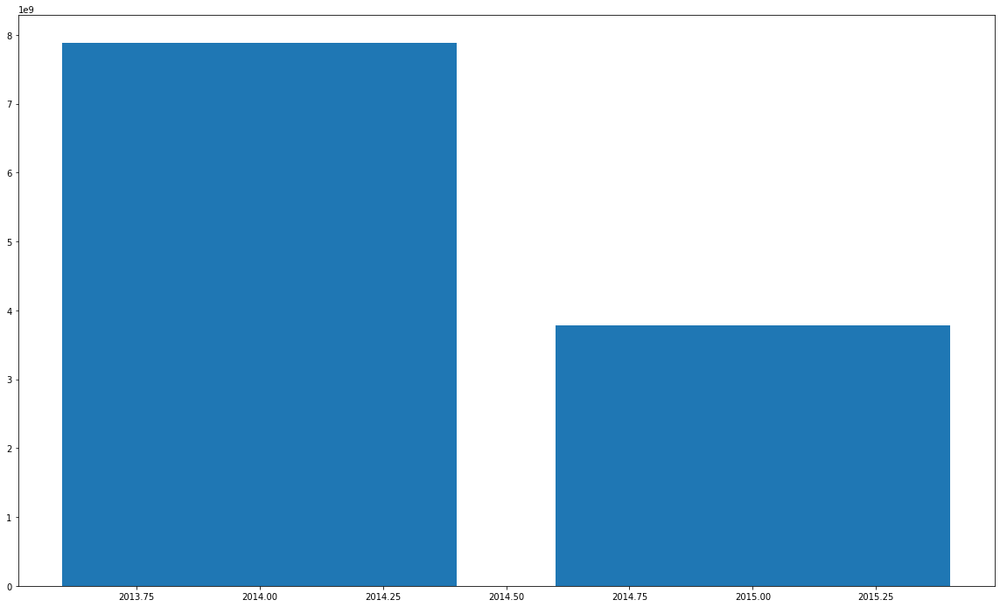

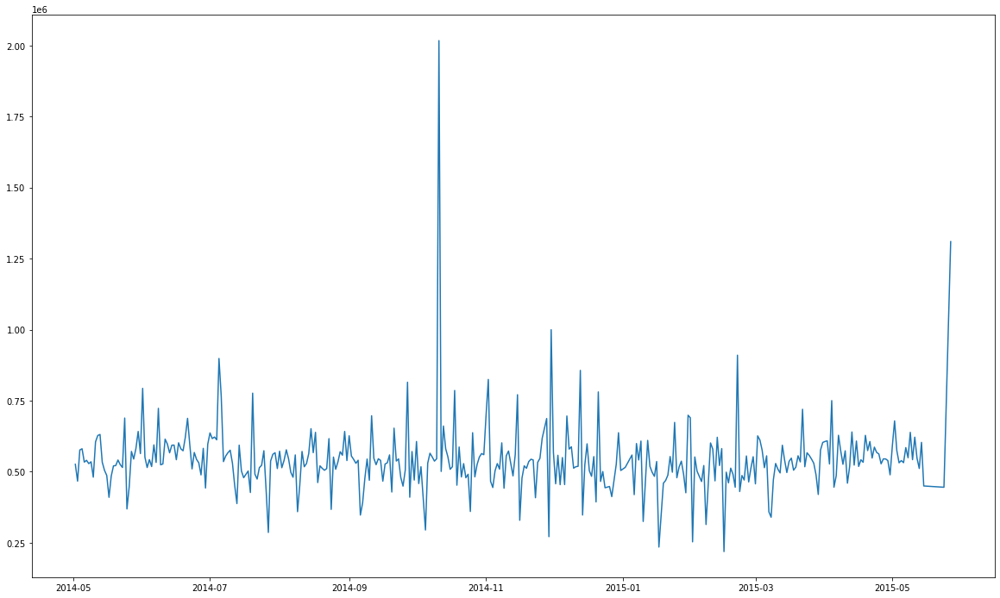

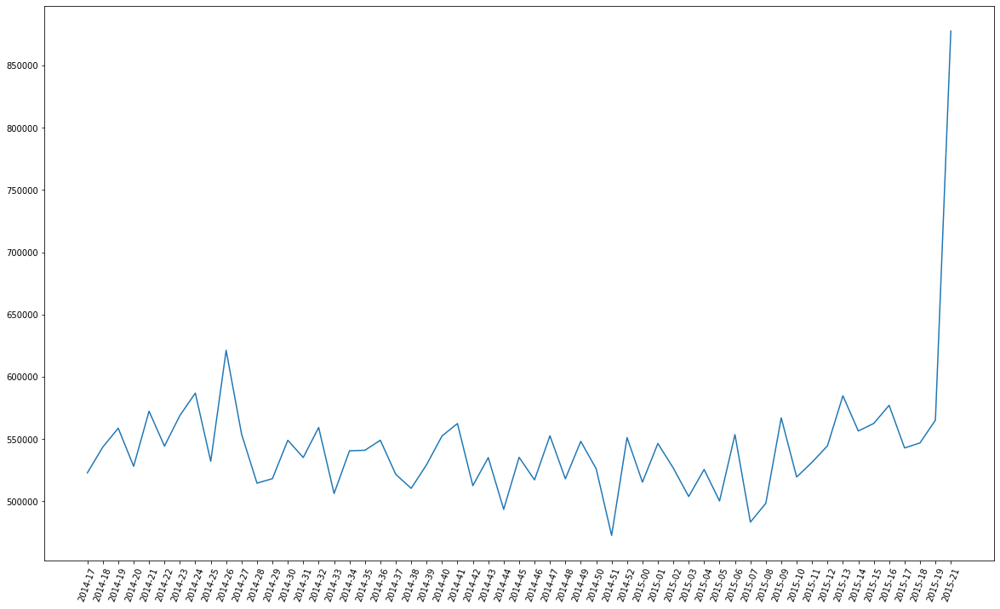

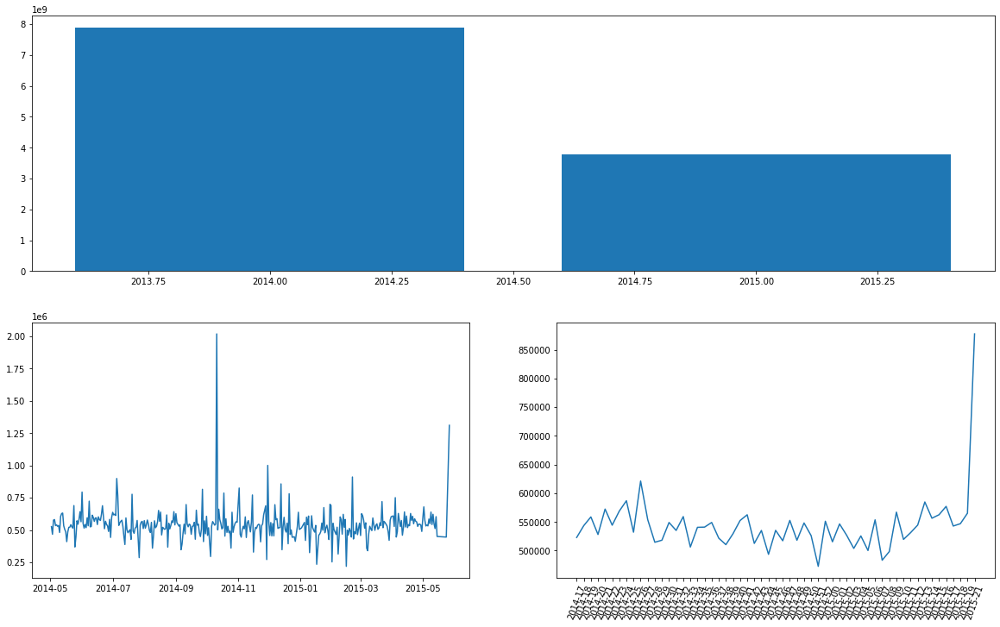

In [ ]:
# 9.Como é o crescimento médio preços de compra dos imóveis, por dia e semana do ano?
#   Desenhar uma variação do preço médio por dia e semana do ano
print('\n\n10.Como é o crescimento médio preços de compra dos imóveis, por dia e semana do ano?')
#************************************Primeiro Gráfico************************************
import matplotlib.pyplot as plt
dados.date = pd.to_datetime(dados.date, errors='coerce')
dados['year'] = dados.date.dt.year
by_year = dados[['price', 'year']].groupby('year').sum().reset_index()
plt.figure(figsize=(20,12))
plt.bar(by_year['year'], by_year['price']);
#************************************Segundo Gráfico*************************************
by_day = dados[['price', 'date']].groupby('date').mean().reset_index()
plt.figure(figsize=(20,12))
plt.plot(by_day['date'], by_day['price']);
#************************************Terceiro Gráfico************************************
dados['year_week'] = dados.date.dt.strftime('%Y-%U')
by_year_week = dados[['price', 'year_week']].groupby('year_week').mean().reset_index()
plt.figure(figsize=(20,12))
plt.plot(by_year_week['year_week'], by_year_week['price'])
plt.xticks(rotation=70);
#*************************************************Dashboard******************************
from matplotlib import gridspec
fig = plt.figure(figsize=(20,12))
specs = gridspec.GridSpec(ncols=2, nrows=2, figure=fig)
ax1 = fig.add_subplot(specs[0,:]) # Primeira linha
ax2 = fig.add_subplot(specs[1,0]) # Segunda linha - Primeira coluna
ax3 = fig.add_subplot(specs[1,1]) # Segunda linha - Segunda coluna
#************************************Primeiro Gráfico************************************
dados['year'] = dados.date.dt.year
by_year = dados[['price', 'year']].groupby('year').sum().reset_index()
ax1.bar(by_year['year'], by_year['price'])
#************************************Segundo Gráfico*************************************
by_day = dados[['price', 'date']].groupby('date').mean().reset_index()
ax2.plot(by_day['date'], by_day['price'])
#************************************Terceiro Gráfico************************************
dados['year_week'] = dados.date.dt.strftime('%Y-%U')
by_year_week = dados[['price', 'year_week']].groupby('year_week').mean().reset_index()
ax3.plot(by_year_week['year_week'], by_year_week['price'])
plt.xticks(rotation=70);

##Algumas questões extra.

1. Crie uma nova coluna chamada: “dormitory_type”
- Se o valor da coluna “bedrooms” for igual à 1 => ‘studio’
- Se o valor da coluna “bedrooms” for igual a 2 => ‘apartament’
- Se o valor da coluna “bedrooms” for maior que 2 => ‘house’
2. Faça um gráfico de barras que represente a soma dos preços pelo número de quartos.
3. Faça um gráfico de linhas que represente a média dos preços pelo ano construção dos imóveis.
4. Faça um gráfico de barras que represente a média dos preços pelo tipo dos dormitórios.
5. Faça um gráfico de linha que mostre a evolução da média dos preços pelo ano da reforma dos imóveis, a partir do ano de 1930.
6. Faça um tabela que mostre a média dos preços por ano de construção e tipo de dormitórios dos imóveis.
7. Crie um Dashboard com os gráficos das questões 02, 03, 04 ( Dashboard: 1 Linha e 2 colunas )
8. Crie um Dashboard com os gráficos das perguntas 02, 04 ( Dashboard: 2 colunas )
9. Crie um Dashboard com os gráficos das perguntas 03, 05 ( Dashboard: 2 Linhas )
10. Faça um gráfico com o tamanho dos pontos sendo igual ao tamanho da sala de estar

2.Crie uma nova coluna chamada: “dormitory_type”
        * Se o valor da coluna “bedrooms” for igual à 1 => ‘studio’
        * Se o valor da coluna “bedrooms” for igual a 2 => ‘apartament’
        * Se o valor da coluna “bedrooms” for maior que 2 => ‘house’


,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,year,year_week,dormitory_type
20171,8562901100,2014-12-30,550000.00,3,2.50,2430,5400,2.00,0,0,3,8,2430,0,2007,0,98074,47.61,-122.06,2640,11990,2014,2014-52,house
4188,1376800115,2014-11-03,585000.00,3,1.00,1450,5378,1.00,0,0,3,7,1190,260,1939,0,98199,47.64,-122.41,1810,5559,2014,2014-44,house
19753,7852120030,2014-08-08,723000.00,4,3.50,3510,9263,2.00,0,0,3,10,3510,0,2001,0,98065,47.54,-121.88,3690,10417,2014,2014-31,house
12385,2923500550,2014-06-25,599990.00,3,2.25,2680,9162,1.00,0,0,3,8,1570,1110,1978,0,98027,47.57,-122.09,2480,8261,2014,2014-25,house
17150,5469501410,2014-09-17,490000.00,4,2.50,3480,12696,1.00,0,0,4,9,1980,1500,1977,0,98042,47.38,-122.15,3480,14175,2014,2014-37,house
11562,5651010320,2014-07-22,335000.00,2,2.00,1380,5840,1.00,0,0,3,7,1380,0,1988,0,98011,47.77,-122.17,1810,5035,2014,2014-29,apartament
13030,2787700180,2015-01-12,320000.00,3,2.00,1250,8636,1.00,0,0,5,7,1250,0,1968,0,98059,47.51,-122.16,1620,7653,2015,2015-02,house
19862,291310340,2014-07-08,550000.00,3,3.50,2490,3582,2.00,0,0,3,8,1720,770,2005,0,98027,47.53,-122.07,1445,1590,2014,2014-27,house
21098,1806900502,2014-10-14,649000.00,3,3.25,1720,936,2.00,0,0,3,8,1030,690,2004,0,98112,47.62,-122.31,1720,1527,2014,2014-41,house
8740,1546600120,2015-03-25,830000.00,4,2.25,3010,12202,1.00,0,0,4,9,3010,0,1959,0,98005,47.64,-122.17,2480,10143,2015,2015-12,house




6.Faça um tabela que mostre a média dos preços por ano de construção e tipo de dormitórios dos imóveis.


price
yr_built dormitory_type          
1900     apartament     589533.33
         house          584854.27
         studio         398944.00
1901     apartament     452856.40
         house          578619.17
...                           ...
2014     house          692687.72
         studio         516500.00
2015     apartament     543250.00
         house          797383.06
         studio         385195.00

[314 rows x 1 columns]

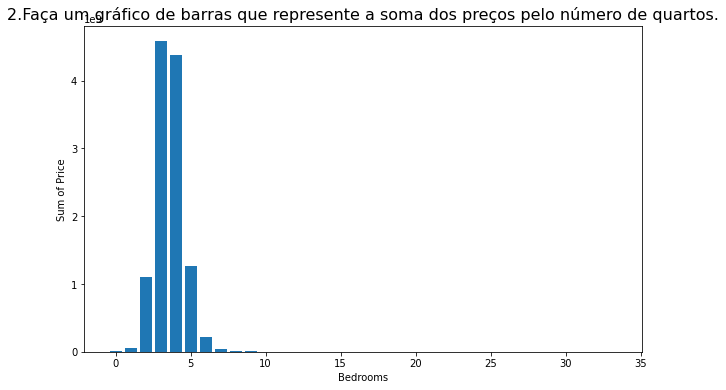

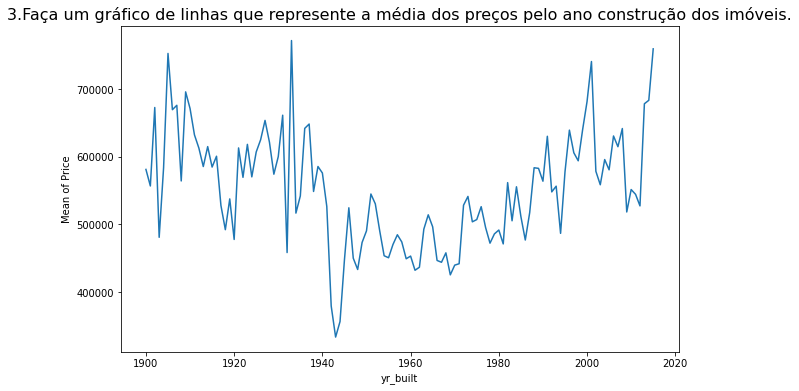

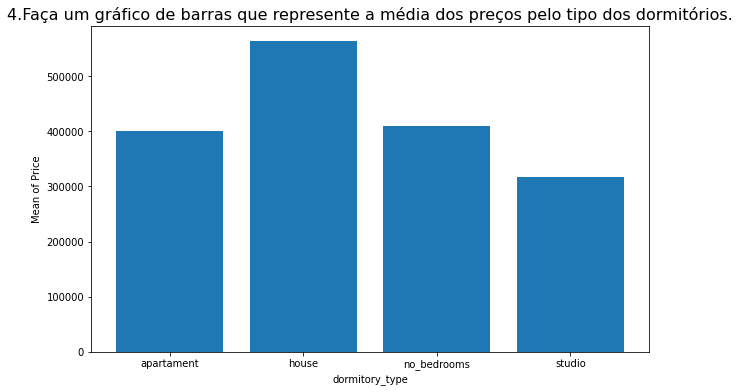

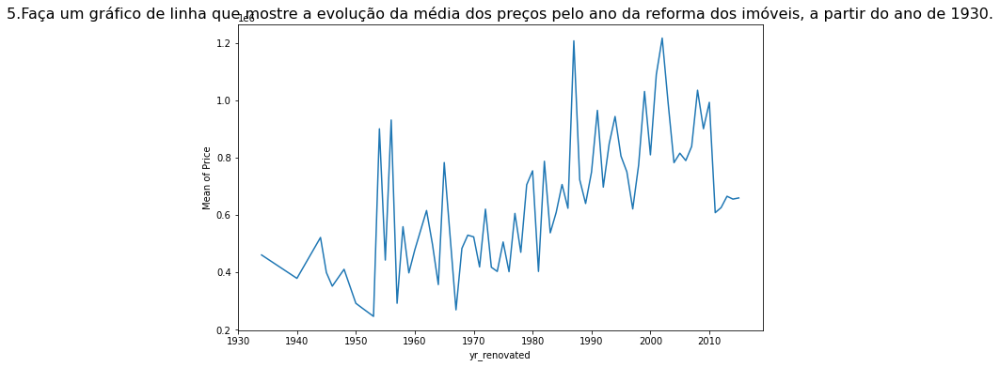

In [ ]:
# 1.Crie uma nova coluna chamada: “dormitory_type”
#         * Se o valor da coluna “bedrooms” for igual à 1 => ‘studio’
#         * Se o valor da coluna “bedrooms” for igual a 2 => ‘apartament’
#         * Se o valor da coluna “bedrooms” for maior que 2 => ‘house’
print('2.Crie uma nova coluna chamada: “dormitory_type”'+
      '\n        * Se o valor da coluna “bedrooms” for igual à 1 => ‘studio’'+
      '\n        * Se o valor da coluna “bedrooms” for igual a 2 => ‘apartament’'+
      '\n        * Se o valor da coluna “bedrooms” for maior que 2 => ‘house’')
dados['dormitory_type'] = 'standard'
dados['dormitory_type'] = dados.bedrooms.apply(lambda x: 'studio' if x==1 else 
                                                        ('apartament' if x==2 else 
                                                        ('house' if x>2 else 
                                                         'no_bedrooms')))
display(dados.sample(10))


# 2.Faça um gráfico de barras que represente a soma dos preços pelo número de quartos.
price_by_bedrooms = dados[['price', 'bedrooms']].groupby('bedrooms').sum().reset_index()
plt.figure(figsize=(10,6))
plt.title('2.Faça um gráfico de barras que represente a soma dos preços pelo número de quartos.', fontsize=16)
plt.bar(price_by_bedrooms['bedrooms'], price_by_bedrooms['price'])
plt.xlabel('Bedrooms')
plt.ylabel('Sum of Price');


# 3.Faça um gráfico de linhas que represente a média dos preços pelo ano construção dos imóveis.
price_by_yr_built = dados[['price', 'yr_built']].groupby('yr_built').mean().reset_index()
plt.figure(figsize=(10,6))
plt.title('3.Faça um gráfico de linhas que represente a média dos preços pelo ano construção dos imóveis.', fontsize=16)
plt.plot(price_by_yr_built['yr_built'], price_by_yr_built['price'])
plt.xlabel('yr_built')
plt.ylabel('Mean of Price');


# 4.Faça um gráfico de barras que represente a média dos preços pelo tipo dos dormitórios.
price_by_dormitory_type = dados[['price', 'dormitory_type']].groupby('dormitory_type').mean().reset_index()
plt.figure(figsize=(10,6))
plt.title('4.Faça um gráfico de barras que represente a média dos preços pelo tipo dos dormitórios.', fontsize=16)
plt.bar(price_by_dormitory_type['dormitory_type'], price_by_dormitory_type['price'])
plt.xlabel('dormitory_type')
plt.ylabel('Mean of Price');


# 5.Faça um gráfico de linha que mostre a evolução da média dos preços pelo ano da reforma dos imóveis, a partir do ano de 1930.
yr_renovated_after_1930 = dados.query('yr_renovated >= 1930')
price_by_yr_renovated = yr_renovated_after_1930[['price', 'yr_renovated']].groupby('yr_renovated').mean().reset_index()
plt.figure(figsize=(10,6))
plt.title('5.Faça um gráfico de linha que mostre a evolução da média dos preços pelo ano da reforma dos imóveis, a partir do ano de 1930.', fontsize=16)
plt.plot(price_by_yr_renovated['yr_renovated'], price_by_yr_renovated['price'])
plt.xlabel('yr_renovated')
plt.ylabel('Mean of Price');


# 6.Faça um tabela que mostre a média dos preços por ano de construção e tipo de dormitórios dos imóveis.
print('\n\n6.Faça um tabela que mostre a média dos preços por ano de construção e tipo de dormitórios dos imóveis.')
display(dados[['price', 'yr_built', 'dormitory_type']].groupby( ['yr_built', 'dormitory_type']).mean())
print('\n\n')

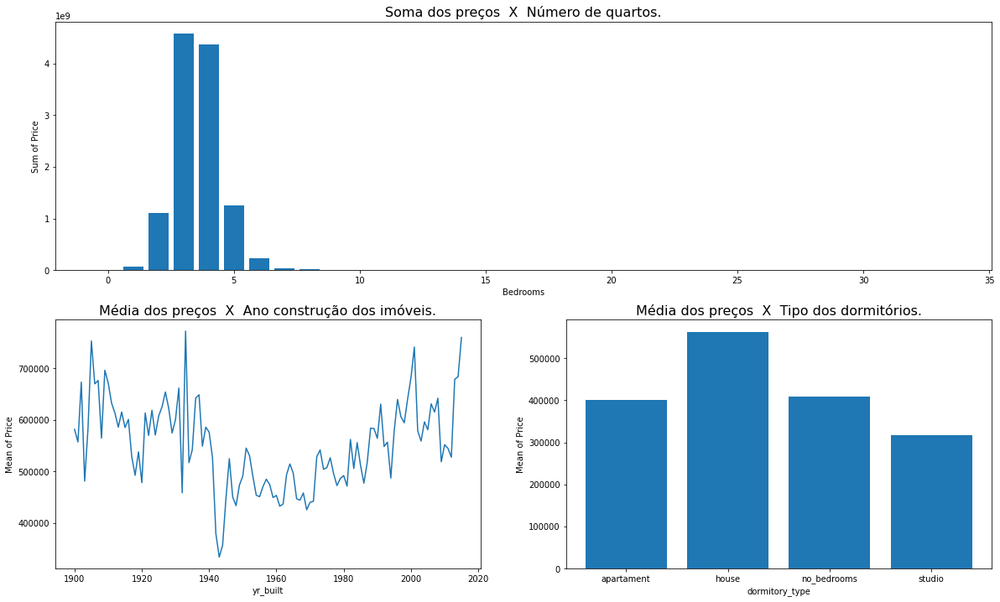

In [ ]:
# 7.Crie um Dashboard com os gráficos das questões 02, 03, 04 ( Dashboard: 1 Linha e 2 colunas )
#*************************************************Dashboard*************************************************
from matplotlib import gridspec
fig = plt.figure(figsize=(20,12))
specs = gridspec.GridSpec(ncols=2, nrows=2, figure=fig)
ax1 = fig.add_subplot(specs[0,:]) # Primeira linha
ax2 = fig.add_subplot(specs[1,0]) # Segunda linha - Primeira coluna
ax3 = fig.add_subplot(specs[1,1]) # Segunda linha - Segunda coluna
#************************************Primeiro Gráfico************************************
ax1.bar(price_by_bedrooms['bedrooms'], price_by_bedrooms['price'])
ax1.set_title('Soma dos preços  X  Número de quartos.', fontsize=16)
ax1.set_xlabel('Bedrooms')
ax1.set_ylabel('Sum of Price')
#************************************Segundo Gráfico*************************************
ax2.plot(price_by_yr_built['yr_built'], price_by_yr_built['price'])
ax2.set_title('Média dos preços  X  Ano construção dos imóveis.', fontsize=16)
ax2.set_xlabel('yr_built')
ax2.set_ylabel('Mean of Price')
#************************************Terceiro Gráfico************************************
ax3.bar(price_by_dormitory_type['dormitory_type'], price_by_dormitory_type['price'])
ax3.set_title('Média dos preços  X  Tipo dos dormitórios.', fontsize=16)
ax3.set_xlabel('dormitory_type')
ax3.set_ylabel('Mean of Price');

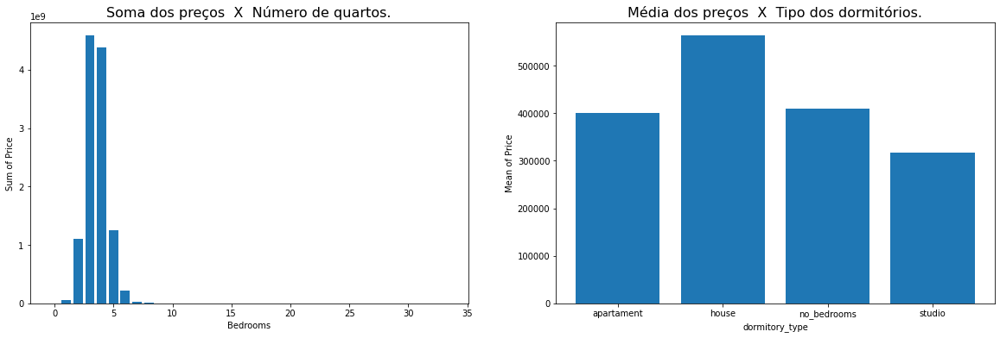

In [ ]:
# 8.Crie um Dashboard com os gráficos das perguntas 02, 04 ( Dashboard: 2 colunas )
from matplotlib import gridspec
fig = plt.figure(figsize=(20,6))
specs = gridspec.GridSpec(ncols=2, nrows=1, figure=fig)
ax1 = fig.add_subplot(specs[:,0]) # Primeira coluna
ax2 = fig.add_subplot(specs[:,1]) # Segunda coluna
#************************************Primeiro Gráfico************************************
ax1.bar(price_by_bedrooms['bedrooms'], price_by_bedrooms['price'])
ax1.set_title('Soma dos preços  X  Número de quartos.', fontsize=16)
ax1.set_xlabel('Bedrooms')
ax1.set_ylabel('Sum of Price')
#************************************Segundo Gráfico*************************************
ax2.bar(price_by_dormitory_type['dormitory_type'], price_by_dormitory_type['price'])
ax2.set_title('Média dos preços  X  Tipo dos dormitórios.', fontsize=16)
ax2.set_xlabel('dormitory_type')
ax2.set_ylabel('Mean of Price');

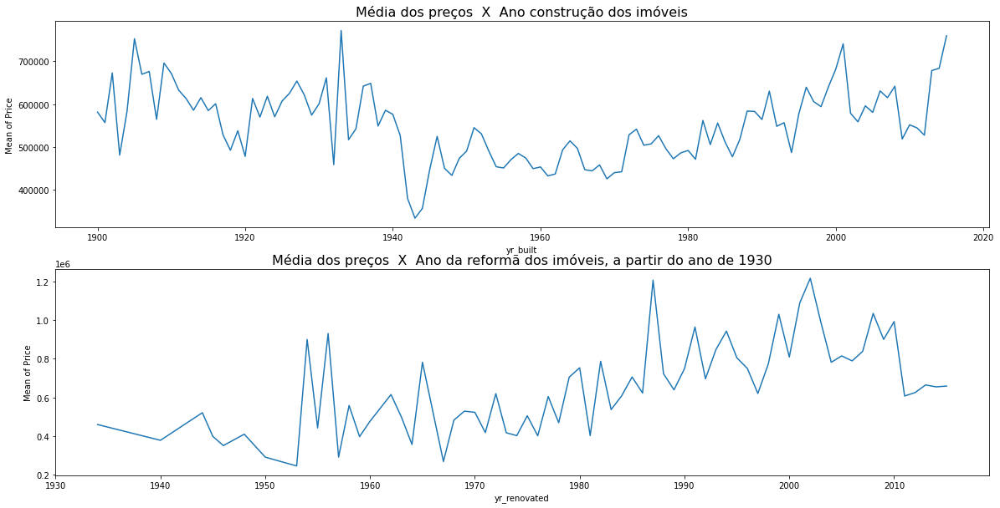

In [ ]:
# 9.Crie um Dashboard com os gráficos das perguntas 03, 05 ( Dashboard: 2 Linhas )
from matplotlib import gridspec
fig = plt.figure(figsize=(20,10))
specs = gridspec.GridSpec(ncols=1, nrows=2, figure=fig)
ax1 = fig.add_subplot(specs[0,:]) # Primeira coluna
ax2 = fig.add_subplot(specs[1,:]) # Segunda coluna
#************************************Primeiro Gráfico************************************
ax1.plot(price_by_yr_built['yr_built'], price_by_yr_built['price'])
ax1.set_title('Média dos preços  X  Ano construção dos imóveis', fontsize=16)
ax1.set_xlabel('yr_built')
ax1.set_ylabel('Mean of Price')
#************************************Segundo Gráfico*************************************
ax2.plot(price_by_yr_renovated['yr_renovated'], price_by_yr_renovated['price'])
ax2.set_title('Média dos preços  X  Ano da reforma dos imóveis, a partir do ano de 1930', fontsize=16)
ax2.set_xlabel('yr_renovated')
ax2.set_ylabel('Mean of Price');

In [ ]:
# 10.Faça um gráfico com o tamanho dos pontos sendo igual ao tamanho da sala de estar
#    Modificar o mapa fazendo com que o pontos tenham o tamanho dependente do tamanho da sala de estar.
print('\n\n9.Eu gostaria de olhar no mapa e conseguir identificar as casas com o maior preço.')
import plotly.express as px
houses = dados[['id', 'lat', 'long', 'sqft_living']]
fig = px.scatter_mapbox(houses,
                        lat='lat',
                        lon='long',
                        size='sqft_living',
                        color_continuous_scale=px.colors.cyclical.IceFire,
                        size_max=30,
                        zoom=8.5)
fig.update_layout(mapbox_style='open-street-map')
fig.update_layout(height=600, margin={'r':0, 't':0, 'l':0, 'b':0})
fig.show()



9.Eu gostaria de olhar no mapa e conseguir identificar as casas com o maior preço.


#**Aula #04 do Curso de Python do ZERO ao DS**

##Novas perguntas do CEO

1.Qual a quantidade de imóveis por nível?
- Nível 0 -> Preço entre R\$ 0 e R\$ 321.950
- Nível 1 -> Preço entre R\$ 321.950 e R\$ 450.000
- Nível 2 -> Preço entre R\$ 450.000 e R\$ 645.000
- Nível 3 -> Acima de R\$ 645.000

2.Adicione as seguintes informações ao 
imóvel:
- O nome da Rua
- O número do Imóvel
- O nome do Bairro
- O nome da Cidade
- O nome da Estado

3.Adicionar o Nível dos imóveis no Mapa como uma Cor

4.Adicionar o Preço dos imóveis como o tamanho do ponto no mapa

5.Adicionar opções de filtros para eu fazer minhas próprias análises:
* Eu quero escolher visualizar imóveis com vista para água ou não.
* Eu quero filtrar os imóveis até um certo valor de preço.

6.Adicionar opções de filtros no último 
dashboard enviado:
* Eu quero visualizar somente 
valor a partir de um data disponível para 
compra

In [ ]:
dados = pd.read_csv("/content/kc_house_data.csv")

# 1.Qual a quantidade de imóveis por nível?
#       * Nível 0 -> Preço entre R$ 0 e R$ 321.950
#       * Nível 1 -> Preço entre R$ 321.950 e R$ 450.000
#       * Nível 2 -> Preço entre R$ 450.000 e R$ 645.000
#       * Nível 3 -> Acima de R$ 645.000
dados['level'] = dados.price.apply(lambda x: 0 if x<=321950 else 
                                            (1 if (x>321950)&(x<=450000) else 
                                            (2 if (x>450000)&(x<=645000) else 3)))
display(dados.sample(10))

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,level
10993,6888900060,20141116T000000,326000.0,6,3.00,2580,8064,1.5,0,0,3,7,1880,700,1913,0,98118,47.5549,-122.287,1510,6084,1
16540,2591840050,20150211T000000,419625.0,4,2.50,2680,11590,2.0,0,0,4,9,2680,0,1988,0,98058,47.4395,-122.163,2580,8225,1
18815,9274200735,20150507T000000,567500.0,4,1.75,2190,5060,1.0,0,0,3,7,1190,1000,1950,0,98116,47.5846,-122.387,1510,4600,2
5836,7955060010,20140613T000000,440000.0,4,2.25,2010,7575,1.0,0,0,3,7,1220,790,1974,0,98034,47.7328,-122.200,1820,7831,1
5263,98030660,20150311T000000,815000.0,4,2.50,3880,7208,2.0,0,0,3,10,3880,0,2006,0,98075,47.5841,-121.971,3280,7221,3
5648,7701930010,20140530T000000,489000.0,3,2.50,2260,19821,2.0,0,0,3,9,2260,0,1994,0,98058,47.4480,-122.088,2750,22718,2
4945,7923300285,20150312T000000,650000.0,4,2.25,2440,9320,1.0,0,0,4,7,1880,560,1957,0,98007,47.5933,-122.135,1530,9335,3
6678,9541800010,20141027T000000,830000.0,5,2.25,2710,19800,1.0,0,0,5,9,1910,800,1959,0,98005,47.5958,-122.175,2120,16400,3
9738,8701600030,20141113T000000,518000.0,5,1.00,1590,5000,1.5,0,0,3,7,1190,400,1929,0,98116,47.5752,-122.381,1590,5000,2
20346,5379805260,20150326T000000,400200.0,4,3.50,2260,30250,2.0,0,0,3,7,2260,0,2013,0,98188,47.4493,-122.281,1270,16350,1


In [ ]:
# 2.Adicione as seguintes informações ao imóvel:
#       * O nome da Rua
#       * O número do Imóvel
#       * O nome do Bairro
#       * O nome da Cidade
#       * O nome da Estado
# - Onde tem essas informações? API chamada GEOPYfrom geopy.geocoders import Nominatim
# 
# initialize Nominatim API 
from geopy.geocoders import Nominatim
geolocator = Nominatim(user_agent="geoapiExercises")
# Create empty rows
dados['road']         = 'NA'
dados['house_number'] = 'NA'
dados['city']         = 'NA'
dados['county']       = 'NA'
dados['state']        = 'NA'
for i in range( len( dados ) ):
    print(f'Loop: {i}/{len( dados )}')
    # make request
    query = str( dados.loc[i, 'lat'] ) + ',' + str( dados.loc[i, 'long'] )
    response = geolocator.reverse( query )
    # parse data
    if 'house_number' in response.raw['address']:
        dados.loc[i, 'house_number'] = response.raw['address']['house_number']
    if 'road' in response.raw['address']:
        dados.loc[i, 'road'] = response.raw['address']['road']
    if 'city' in response.raw['address']:
        dados.loc[i, 'city'] = response.raw['address']['city']
    if 'county' in response.raw['address']:
        dados.loc[i, 'county'] =response.raw['address']['county']
    if 'state' in response.raw['address']:
        dados.loc[i, 'state'] = response.raw['address']['state']

In [ ]:
dados.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,road,house_number,city,county,state
0,7129300520,20141013T000000,221900.0,3,1.00,1180,5650,1.0,0,0,3,7,1180,0,1955,0,98178,47.5112,-122.257,1340,5650,61st Avenue South,10012,Seattle,King County,Washington
1,6414100192,20141209T000000,538000.0,3,2.25,2570,7242,2.0,0,0,3,7,2170,400,1951,1991,98125,47.7210,-122.319,1690,7639,Northeast 127th Street,837,Seattle,King County,Washington
2,5631500400,20150225T000000,180000.0,2,1.00,770,10000,1.0,0,0,3,6,770,0,1933,0,98028,47.7379,-122.233,2720,8062,81st Avenue Northeast,15109,NA,King County,Washington
3,2487200875,20141209T000000,604000.0,4,3.00,1960,5000,1.0,0,0,5,7,1050,910,1965,0,98136,47.5208,-122.393,1360,5000,Fauntleroy Way Southwest,9236,Seattle,King County,Washington
4,1954400510,20150218T000000,510000.0,3,2.00,1680,8080,1.0,0,0,3,8,1680,0,1987,0,98074,47.6168,-122.045,1800,7503,221st Avenue Northeast,923,NA,King County,Washington


In [ ]:
# 3.Adicionar o Nível dos imóveis no Mapa como uma Cor
# 4.Adicionar o Preço dos imóveis como o tamanho do ponto no mapa
houses = dados[['id', 'lat', 'long', 'price', 'level']].copy()
houses['level'] = houses.level.astype(int)
fig = px.scatter_mapbox( houses, 
    lat="lat", 
    lon="long", 
    color="level", 
    size="price",
    color_continuous_scale=px.colors.sequential.Bluered_r, 
    size_max=15, 
    zoom=8.5)
fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(height=600, margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

In [ ]:
# 5.Adicionar opções de filtros para eu fazer minhas próprias análises:
#       * Eu quero escolher visualizar imóveis com vista para água ou não.
#       * Eu quero filtrar os imóveis até um certo valor de preço.
import ipywidgets as widgets
from ipywidgets import Layout
from ipywidgets import fixed
# Prepare Data
df = pd.read_csv( 'kc_house_data.csv' )
df['is_waterfront'] = df['waterfront'].apply( lambda x: 'yes' if x == 1 else 'no' )
# define level of prices
df['level'] = df['price'].apply( lambda x: 0 if x <= 321950 else 
                                           1 if ( x > 321950 ) & ( x <= 450000) else 
                                           2 if ( x > 450000 ) & ( x <= 645000 ) else 3 )
df['level'] = df['level'].astype( int )
style = {'description_width': 'initial'}
# Iteractive buttons
price_limit = widgets.IntSlider(value = 540000, min = 75000, max = 7700000, 
                                step = 1, description='Maximun Price', disable=False,
                                style=style)
waterfront_bar = widgets.Dropdown(options = df['is_waterfront'].unique().tolist(),
                                  value = 'yes',
                                  description = 'Water View',
                                  disable=False)
def update_map( df, waterfront, limit ):
    houses = df[(df['price'] <= limit) & 
    (df['is_waterfront'] == waterfront)]
    [['id', 'lat', 'long', 'price', 'level', 'bathrooms']]
    fig = px.scatter_mapbox( houses, 
                            lat="lat", 
                            lon="long", 
                            size="price",
                            color="level",
                            color_continuous_scale=px.colors.sequential.Bluered_r, 
                            size_max=15, 
                            zoom=8.5)
    fig.update_layout(mapbox_style="open-street-map")
    fig.update_layout(height=600, margin={"r":0,"t":0,"l":0,"b":0})
    fig.show()
widgets.interactive( update_map, df=fixed( df ), waterfront=waterfront_bar, limit=price_limit )

interactive(children=(Dropdown(description='Water View', index=1, options=('no', 'yes'), value='yes'), IntSlid…

In [ ]:
# 6.Adicionar opções de filtros no último dashboard enviado:
#   Eu quero visualizar somente valor a partir de um data disponível para compra
import ipywidgets as widgets
from ipywidgets import Layout
from ipywidgets import fixed
# Prepare Data
df = pd.read_csv( 'kc_house_data.csv' )
# Change data format
df['year'] = pd.to_datetime( df['date'] ).dt.strftime( '%Y' )
df['date'] = pd.to_datetime( df['date'] ).dt.strftime( '%Y-%m-%d' )
df['year_week'] = pd.to_datetime( df['date'] ).dt.strftime( '%Y-%U' )
# Widget to control data
date_limit = widgets.SelectionSlider(options = df['date'].sort_values().unique().tolist(),
                                     value='2014-12-01',
                                     description='Disponível',
                                     disable=False,
                                     continuous_update=False,
                                     orientation='horizontal',
                                     readout=True)
def update_map( data, limit ):
    # Filter data
    df = data[data['date'] >= limit].copy()
    fig = plt.figure( figsize=(24, 12) )
    specs = gridspec.GridSpec( ncols=2, nrows=2, figure=fig )
    ax1 = fig.add_subplot( specs[0, :] ) # First Row
    ax2 = fig.add_subplot( specs[1, 0] ) # First Row First Column
    ax3 = fig.add_subplot( specs[1, 1] ) # Second Row First Column
    by_year = df[['id', 'year']].groupby( 'year' ).sum().reset_index()
    ax1.bar( by_year['year'], by_year['id'] )
    by_day = df[['id', 'date']].groupby( 'date' ).mean().reset_index()
    ax2.plot( by_day['date'], by_day['id'] )
    ax2.set_title( "Title: Avg Price by Day" )
    df['year_week'] = pd.to_datetime( df['date'] ).dt.strftime( '%Y-%U' )
    by_week_of_year = df[['id', 'year_week']].groupby( 'year_week' ).mean().reset_index()
    ax3.bar( by_week_of_year['year_week'], by_week_of_year['id'] )
    ax3.set_title( "Title: Avg Price by Week of Year" )
    plt.xticks( rotation=60);
widgets.interactive( update_map, data=fixed( df ), limit=date_limit )

interactive(children=(SelectionSlider(continuous_update=False, description='Disponível', index=212, options=('…

##Algumas questões extra.

In [ ]:
# 1. Qual a média do preço de compra dos imóveis por “Nível”? 
#       - Nível 0 -> Preço entre R$ 0 e R$ # 321.950
#       - Nível 1 -> Preço entre R$ 321.950 e # R$ 450.000
#       - Nível 2 -> Preço entre R$ 450.000 e # R$ 645.000
#       - Nível 3 -> Acima de R$ 645.00
print('1. Qual a média do preço de compra dos imóveis por “Nível”?')
pd.set_option('display.float_format', lambda x: '%.2f' % x)
dados['level'] = dados.price.apply(lambda x: 0 if x<321950 else 
                                            (1 if (x>=321950)&(x<450000) else
                                            (2 if (x>=450000)&(x<645000) else 3)))
display(dados[['price', 'level']].groupby('level').mean().T)



# 2. Qual a média do tamanho da sala de estar dos imóveis por “Size” ?
#       - Size 0 -> Tamanho entre 0 e 1427 sqft
#       - Size 1 -> Tamanho entre 1427 e 1910 sqft
#       - Size 2 -> Tamanho entre 1910 e 2550 sqft
#       - Size 3 -> Tamanho acima de 2550 sqft
print('\n\n\n2. Qual a média do tamanho da sala de estar dos imóveis por “Size” ?')
dados['size'] = dados.sqft_living.apply(lambda x: 0 if x<1427 else
                                                 (1 if (x>=1427)&(x<1910) else
                                                 (2 if (x>=1910)&(x<2550) else 3)))

display(dados[['sqft_living', 'size']].groupby('size').mean().T)

1. Qual a média do preço de compra dos imóveis por “Nível”?


level,0,1,2,3
price,251544.62,383585.21,536164.42,985008.98





2. Qual a média do tamanho da sala de estar dos imóveis por “Size” ?


size,0,1,2,3
sqft_living,1123.78,1661.20,2202.70,3318.99


In [ ]:
# 3. Adicione as seguinte informações ao conjunto de dados original:
#       - Place ID: Identificação da localização
#       - OSM Type: Open Street Map type
#       - Country: Nome do País
#       - Country Code: Código do País
from geopy.geocoders import Nominatim
geolocator = Nominatim(user_agent="geoapiExercises")
# Create empty rows
dados['place_id']     = 'NA'
dados['osm_type']     = 'NA'
dados['country']      = 'NA'
dados['country_code'] = 'NA'
for i in range( len( dados ) ):
    # print(f'Loop: {i}/{len( dados )}')
    # make request
    query = str( dados.loc[i, 'lat'] ) + ',' + str( dados.loc[i, 'long'] )
    response = geolocator.reverse( query )
    # parse data
    if 'place_id' in response.raw:
        dados.loc[i, 'place_id'] = response.raw['place_id']
    if 'osm_type' in response.raw:
        dados.loc[i, 'osm_type']         = response.raw['osm_type']
    if 'country' in response.raw['address']:
        dados.loc[i, 'country']         = response.raw['address']['country']
    if 'country_code' in response.raw['address']:
        dados.loc[i, 'country_code']       = response.raw['address']['country_code']

In [ ]:
# 4. Adicione os seguinte filtros no Mapa:
#       - Tamanho mínimo da área da sala de estar.
#       - Número mínimo de banheiros.
#       - Valor Máximo do Preço.
#       - Tamanho máximo da área do porão.
#       - Filtro das Condições do Imóvel.
#       - Filtro por Ano de Construção.

# 5. Adicione os seguinte filtros no Dashboard:
#       - Filtro por data disponível para compra.
#       - Filtro por ano de renovação.
#       - Filtro se possui vista para a água ou não
import ipywidgets as widgets
from ipywidgets import Layout
from ipywidgets import fixed
import plotly.express as px

# Prepare Data
df = pd.read_csv( 'kc_house_data.csv' )
# df['is_waterfront'] = df['waterfront'].apply( lambda x: 'yes' if x == 1 else 'no' )
# define level of prices
df['level'] = df['price'].apply( lambda x: 0 if x <= 321950 else 
                                           1 if ( x > 321950 ) & ( x <= 450000) else 
                                           2 if ( x > 450000 ) & ( x <= 645000 ) else 3 )
df['level'] = df['level'].astype( int )
style = {'description_width': 'initial'}
# -----------------------------------Iteractive buttons-----------------------------------
# <><><><><><><><><><><><><><><><><>  SLIDER  <><><><><><><><><><><><><><><><><>  
sqft_sqft_living    = widgets.IntSlider(value = 6770, min = 290, max = 13540,
                                        step = 1, description='sqft_living_min', disable=False,
                                        style=style)
bathrooms_limit     = widgets.IntSlider(value = 4, min = 0, max = 8,
                                        step = 1, description='bathrooms_min', disable=False,
                                        style=style)
price_limit         = widgets.IntSlider(value = 3850000, min = 75000, max = 7700000,
                                        step = 1, description='price_max', disable=False,
                                        style=style)
sqft_basement_limit = widgets.IntSlider(value = 2410, min = 0, max = 4820,
                                        step = 1, description='sqft_basement_max', disable=False,
                                        style=style)
# <><><><><><><><><><><><><><><><><>  DROPDOWN  <><><><><><><><><><><><><><><><>
condition_bar = widgets.Dropdown(options = df['condition'].sort_values().unique().tolist(),
                                 description='Condição',
                                 disable=False)
yr_built_bar = widgets.Dropdown(options = df['yr_built'].sort_values().unique().tolist(),
                                 description='Ano de construção',
                                 disable=False)

yr_renovated_bar = widgets.Dropdown(options = df['yr_renovated'].sort_values().unique().tolist(),
                                 description='yr_renovated',
                                 disable=False)
waterfront_bar = widgets.Dropdown(options = df['waterfront'].sort_values().unique().tolist(),
                                 description='waterfront',
                                 disable=False)


def update_map( df, sqft_sqft_living, bathrooms_limit, price_limit, sqft_basement_limit, condition_bar, yr_built_bar, yr_renovated_bar, waterfront_bar):
    houses = df[(df['sqft_living'] >= sqft_sqft_living) &
                (df['bathrooms'] >= bathrooms_limit) &
                (df['price'] <= price_limit) &
                (df['sqft_basement'] <= sqft_basement_limit) &
                (df['condition'] == condition_bar) &
                (df['yr_built'] == yr_built_bar) &
                (df['yr_renovated'] == yr_renovated_bar) &
                (df['waterfront'] == waterfront_bar)]
    [['id', 'lat', 'long', 'price', 'sqft_living', 'bathrooms, sqft_basement_limit', 'condition', 'yr_built']]
    fig = px.scatter_mapbox( houses, 
                            lat="lat", 
                            lon="long", 
                            size="price",
                            color="level",
                            color_continuous_scale=px.colors.sequential.Bluered_r, 
                            size_max=15, 
                            zoom=8.5)
    fig.update_layout(mapbox_style="open-street-map")
    fig.update_layout(height=600, margin={"r":0,"t":0,"l":0,"b":0})
    fig.show()
widgets.interactive( update_map, df=fixed( df ), 
                    sqft_sqft_living    = sqft_sqft_living, 
                    bathrooms_limit     = bathrooms_limit, 
                    price_limit         = price_limit, 
                    sqft_basement_limit = sqft_basement_limit,
                    condition_bar       = condition_bar,
                    yr_built_bar        = yr_built_bar,
                    yr_renovated_bar    = yr_renovated_bar,
                    waterfront_bar      = waterfront_bar)

interactive(children=(IntSlider(value=6770, description='sqft_living_min', max=13540, min=290, style=SliderSty…

#**Aula #05 do Curso de Python do ZERO ao DS**

##Organizar o código da Aula #04 em funções

In [ ]:
# =============================================================================
# Bibliotecas
# =============================================================================
import pandas as pd
import numpy as np
from geopy.geocoders import Nominatim
import plotly.express as px
from google.colab import files

# =============================================================================
# Funções
# =============================================================================
def descriptive_statistics(data):
    pd.set_option('display.float_format', lambda x: '%.2f' % x)
    print(data.info(), end='\n\n')
    display(data.describe().T[['mean', 'std', 'min', 'max']])
    return None


def create_new_attributes(data, geodata=False):
    data['dormitory_type'] = data.bedrooms.apply(lambda x: 'studio' if x==1 else 
                                                            ('apartament' if x==2 else 
                                                            ('house' if x>2 else 'no_bedrooms')))
    data['condition_type'] = data.condition.apply(lambda x: 'bad' if x<=2 else 
                                                             ('good' if x>=5 else 
                                                              'regular'))
    data['level'] = data.price.apply(lambda x: 0 if x<=321950 else 
                                                (1 if (x>321950)&(x<=450000) else 
                                                (2 if (x>450000)&(x<=645000) else 3)))
    data['size'] = data.sqft_living.apply(lambda x: 0 if x<1427 else
                                                     (1 if (x>=1427)&(x<1910) else
                                                     (2 if (x>=1910)&(x<2550) else 3)))
    
    if geodata == True:
        # initializa API
        geolocator = Nominatim( user_agent='geopiExercises' )

        # only 20 rows
        data = data.head(20)

        # Create empty rows
        data.loc[:, 'road'] = 'NA'
        data.loc[:, 'house_number'] = 'NA'
        data.loc[:, 'city'] = 'NA'
        data.loc[:, 'county'] = 'NA'
        data.loc[:, 'state'] = 'NA'

        for i in range( len( data ) ):
            print( 'Loop: {}/{}'.format( i, len( data ) ) )
            # make request
            query = str( data.loc[i, 'lat'] ) + ',' + str( data.loc[i, 'long'] )
            response = geolocator.reverse( query )

            # parse data
            if 'house_number' in response.raw['address']:
                data.loc[i, 'house_number'] = response.raw['address']['house_number']
            if 'road' in response.raw['address']:
                data.loc[i, 'road'] = response.raw['address']['road']
            if 'city' in response.raw['address']:
                data.loc[i, 'city'] = response.raw['address']['city']
            if 'county' in response.raw['address']:
                data.loc[i, 'county'] = response.raw['address']['county']
            if 'state' in response.raw['address']:
                data.loc[i, 'state'] = response.raw['address']['state']
    
    return data


def draw_map( data ):
    # map
    houses = data[['id', 'lat', 'long', 'price', 'level']].copy()
    fig = px.scatter_mapbox( houses,
                            lat="lat",
                            lon="long",
                            color="level",
                            size="price",
                            color_continuous_scale=px.colors.sequential.Bluered,
                            size_max=15,
                            zoom=8)
    fig.update_layout(mapbox_style="open-street-map")
    fig.update_layout(height=600, margin={"r":0,"t":0,"l":0,"b":0})

    return fig


if __name__ == "__main__":
    # =========================================================================
    # Extração (Extraction)
    # =========================================================================
    # load dataset

    # Download dataset from Kaggle
    uploaded = files.upload()
    # Then move kaggle.json into the folder where the API expects to find it.
    !mkdir -p ~/.kaggle/ && mv kaggle.json ~/.kaggle/ && chmod 600 ~/.kaggle/kaggle.json
    !kaggle datasets download "harlfoxem/housesalesprediction"
    !unzip housesalesprediction.zip

    data = pd.read_csv( 'kc_house_data.csv' )

    # =========================================================================
    # Transformação (Transformation)
    # =========================================================================
    # convert object to date
    data['date'] = pd.to_datetime( data['date'] )

    # make descriptive analysis
    descriptive_statistics( data )

    # create new attributes
    create_new_attributes( data, geodata=False )

    # =========================================================================
    # Carregamento (Load)
    # =========================================================================
    # draw a map
    fig = draw_map( data )
    fig.show()

Saving kaggle.json to kaggle.json
  0% 0.00/780k [00:00<?, ?B/s]
100% 780k/780k [00:00<00:00, 51.3MB/s]
Archive:  housesalesprediction.zip
  inflating: kc_house_data.csv       
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21613 entries, 0 to 21612
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   id             21613 non-null  int64         
 1   date           21613 non-null  datetime64[ns]
 2   price          21613 non-null  float64       
 3   bedrooms       21613 non-null  int64         
 4   bathrooms      21613 non-null  float64       
 5   sqft_living    21613 non-null  int64         
 6   sqft_lot       21613 non-null  int64         
 7   floors         21613 non-null  float64       
 8   waterfront     21613 non-null  int64         
 9   view           21613 non-null  int64         
 10  condition      21613 non-null  int64         
 11  grade          21613 non-null  int64         


,mean,std,min,max
id,4580301520.86,2876565571.31,1000102.00,9900000190.00
price,540088.14,367127.20,75000.00,7700000.00
bedrooms,3.37,0.93,0.00,33.00
bathrooms,2.11,0.77,0.00,8.00
sqft_living,2079.90,918.44,290.00,13540.00
sqft_lot,15106.97,41420.51,520.00,1651359.00
floors,1.49,0.54,1.00,3.50
waterfront,0.01,0.09,0.00,1.00
view,0.23,0.77,0.00,4.00
condition,3.41,0.65,1.00,5.00


# A Exploração de Dados

## Levantamento de hipóteses sobre o Comportamento do Negócio.

* Casas com garagens são mais caras? Porque?
> Não temos como estimar a interferência das garagens nos preços dos imóveis pois esta variável não consta no Dataset.
* Casas com muitos quartos são mais caras? Porque? A partir de quantos quartos o preço aumenta? Qual o incremento de preço por cada quarto adicionado?
> Ao longo da análise verificaremos que a quantidade de quartos terá grande influência no valor do imóvel.
* As casas mais caras estão no centro? Qual a região? Existe alguma coisa na região que tem correlação com valor de venda da casa? Shoppings? Montanhas? Pessoas Famosas?

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
from scipy import stats
import numpy as np

In [ ]:
dados = dados.drop(columns='date')

In [ ]:
# Removendo outliers

# https://towardsdatascience.com/ways-to-detect-and-remove-the-outliers-404d16608dba

z = np.abs(stats.zscore(dados))
dados = dados[(z < 3).all(axis=1)]
dados.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 18702 entries, 0 to 21612
Data columns (total 20 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             18702 non-null  int64  
 1   price          18702 non-null  float64
 2   bedrooms       18702 non-null  int64  
 3   bathrooms      18702 non-null  float64
 4   sqft_living    18702 non-null  int64  
 5   sqft_lot       18702 non-null  int64  
 6   floors         18702 non-null  float64
 7   waterfront     18702 non-null  int64  
 8   view           18702 non-null  int64  
 9   condition      18702 non-null  int64  
 10  grade          18702 non-null  int64  
 11  sqft_above     18702 non-null  int64  
 12  sqft_basement  18702 non-null  int64  
 13  yr_built       18702 non-null  int64  
 14  yr_renovated   18702 non-null  int64  
 15  zipcode        18702 non-null  int64  
 16  lat            18702 non-null  float64
 17  long           18702 non-null  float64
 18  sqft_l

### Histograma do preço dos imóveis

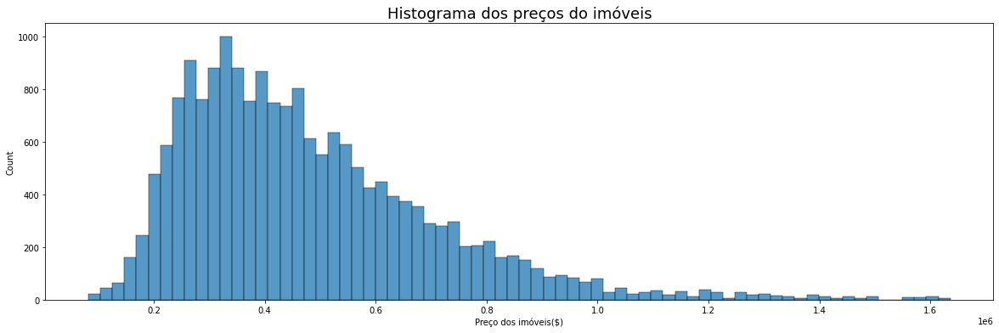

In [ ]:
ax = sns.histplot(dados.price)
ax.figure.set_size_inches(20,6)
ax.set_title('Histograma dos preços do imóveis', fontsize=18)
ax.set_xlabel('Preço dos imóveis($)');

### Box-plot (Preço)



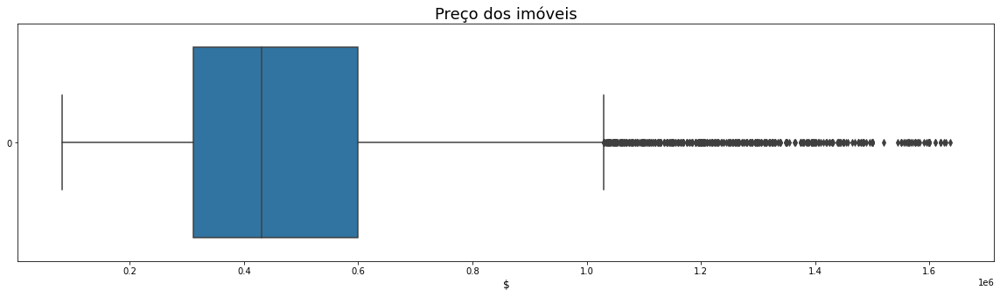

In [ ]:
ax = sns.boxplot(data=dados.price, orient='h')

ax.figure.set_size_inches(20,5)
ax.set_title('Preço dos imóveis', fontsize=18)
ax.set_xlabel('$', fontsize=12)
ax;

Podemos ver que os preços dos imóveis se concentram abaixo de $1.000.000 conforme observado no histograma e no box-plot. 

## Vamos verificar as variações dos preços com base em algumas variáveis

### Box-plot (Preço x Quartos)

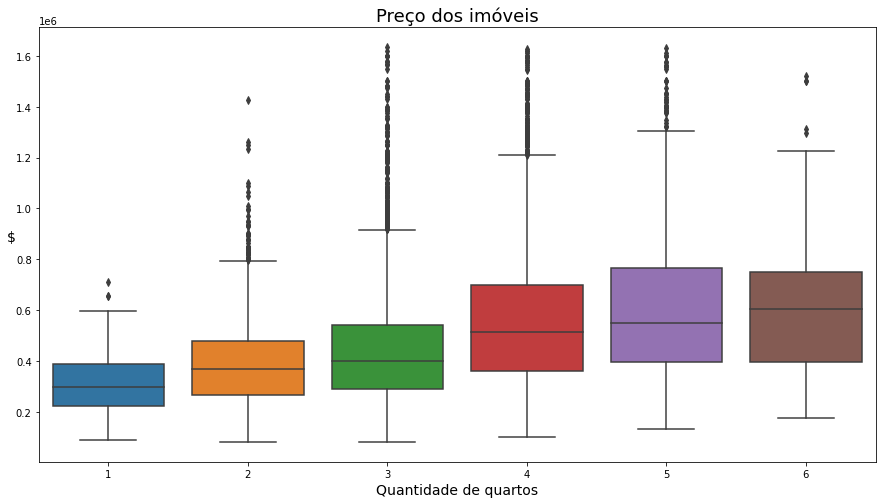

In [ ]:
ax = sns.boxplot(data=dados, x='bedrooms', y='price')

ax.figure.set_size_inches(15,8)
ax.set_title('Preço dos imóveis', fontsize=18)
ax.set_xlabel('Quantidade de quartos', fontsize=14)
ax.set_ylabel('$', fontsize=14, rotation=0)
ax;

### Box-plot (Preço x Andares)

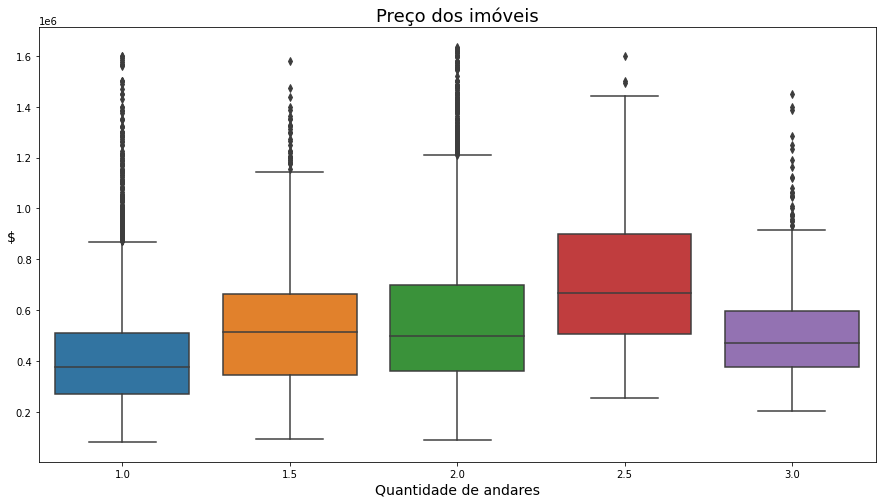

In [ ]:
ax = sns.boxplot(data=dados, x='floors', y='price')

ax.figure.set_size_inches(15,8)
ax.set_title('Preço dos imóveis', fontsize=18)
ax.set_xlabel('Quantidade de andares', fontsize=14)
ax.set_ylabel('$', fontsize=14, rotation=0)
ax;

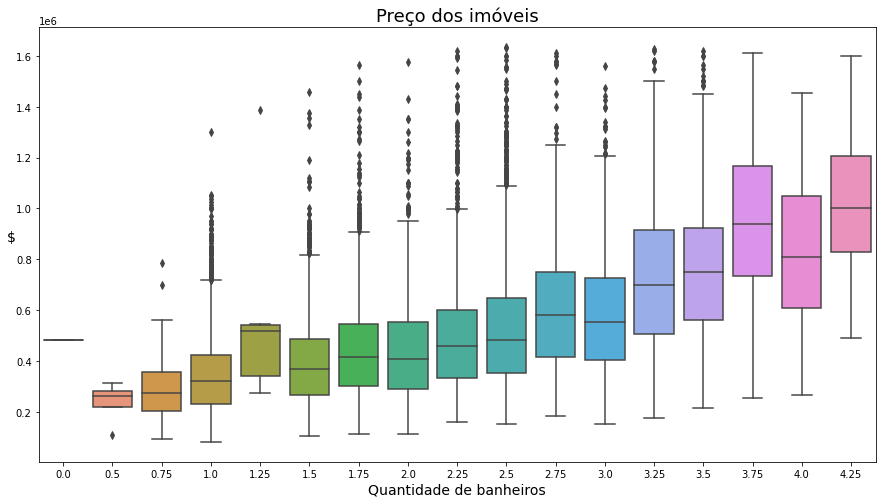

In [ ]:
ax = sns.boxplot(data=dados, x='bathrooms', y='price')

ax.figure.set_size_inches(15,8)
ax.set_title('Preço dos imóveis', fontsize=18)
ax.set_xlabel('Quantidade de banheiros', fontsize=14)
ax.set_ylabel('$', fontsize=14, rotation=0)
# ax.save("preco_banheiros.png")
plt.savefig('preco_banheiros.png')
ax;

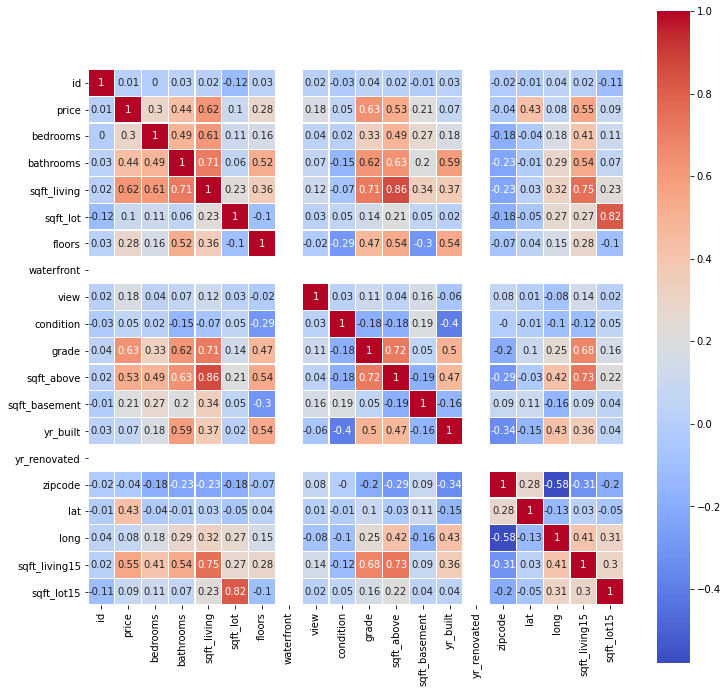

In [ ]:
plt.figure(figsize=(12,12))
sns.heatmap(dados.corr().round(2), annot=True, linewidths=0.2, cmap='coolwarm', square=True);

Com base na matriz de correlação acima podemos perceber que o **preço** tem uma maior correlação com as variáveis **bathrooms**, **sqft_living**, **grade**, **sqft_above** e **sqft_living15**, todas elas com valores acima de 0,5.

Ou seja, essas variáveis são as que causam mais impacto no preço dos imóveis e serão as variáveis usadas para criar o modelo de regressão linear.

---





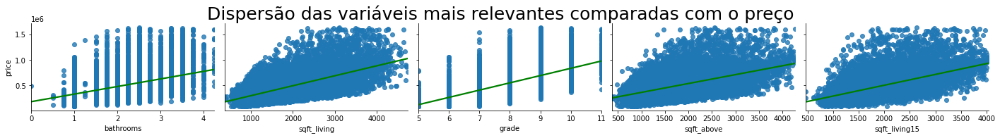

In [ ]:
ax = sns.pairplot(data=dados, y_vars='price', x_vars=['bathrooms', 'sqft_living', 'grade', 'sqft_above', 'sqft_living15'], 
                  kind='reg', diag_kind=None, aspect=1.6, plot_kws={'line_kws':{'color':'green'}})
ax.fig.suptitle('Dispersão das variáveis mais relevantes comparadas com o preço', fontsize=25, y=1.05)
ax;

# Estimando um modelo de regressão linear

## Fazendo a transformação dos dados

Para aplicar os testes estatísticos a seguir iremos transformar as variáveis para a escala logarítmica 

In [ ]:
import numpy as np

In [ ]:
dados['log_price'] = np.log(dados['price'])
dados['log_bathrooms'] = np.log(dados['bathrooms'] + 1)
dados['log_sqft_living'] = np.log(dados['sqft_living'])
dados['log_grade'] = np.log(dados['grade'])
dados['log_sqft_above'] = np.log(dados['sqft_above'])
dados['log_sqft_living15'] = np.log(dados['sqft_living15'])

In [ ]:
dados_selecionados = dados[['log_price', 'log_bathrooms', 'log_sqft_living', 'log_grade', 'log_sqft_above', 'log_sqft_living15']]
dados_selecionados.head()

,log_price,log_bathrooms,log_sqft_living,log_grade,log_sqft_above,log_sqft_living15
0,12.309982,0.693147,7.073270,1.945910,7.073270,7.200425
2,12.100712,0.693147,6.646391,1.791759,6.646391,7.908387
3,13.311329,1.386294,7.580700,1.945910,6.956545,7.215240
4,13.142166,1.098612,7.426549,2.079442,7.426549,7.495542
6,12.458775,1.178655,7.447168,1.945910,7.447168,7.713338


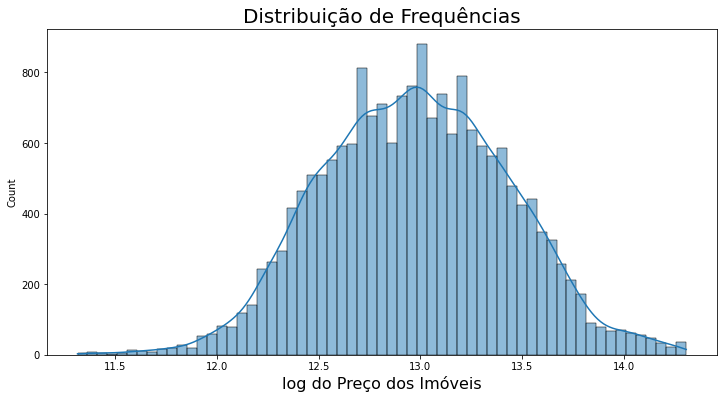

In [ ]:
ax = sns.histplot(data=dados_selecionados.log_price, kde=True)
ax.figure.set_size_inches(12, 6)
ax.set_title('Distribuição de Frequências', fontsize=20)
ax.set_xlabel('log do Preço dos Imóveis', fontsize=16)
ax;

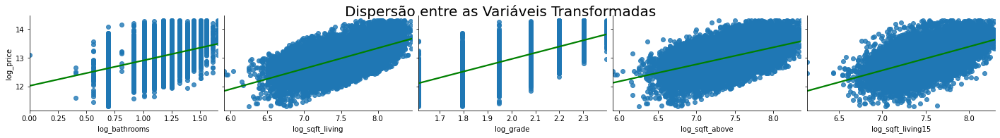

In [ ]:
ax = sns.pairplot(data=dados, y_vars='log_price', x_vars=['log_bathrooms', 'log_sqft_living', 'log_grade', 'log_sqft_above', 'log_sqft_living15'], 
                  kind='reg', diag_kind=None, aspect=1.6, plot_kws={'line_kws':{'color':'green'}})
ax.fig.suptitle('Dispersão entre as Variáveis Transformadas', fontsize=20, y=1.05)
ax;

## Criando os datasets de treino e teste

In [ ]:
# Importando o train_test_split da biblioteca scikit-learn
from sklearn.model_selection import train_test_split

# Criando uma Series (pandas) para armazenar o Preço dos Imóveis (y)
y = dados_selecionados.log_price

# Criando um DataFrame (pandas) para armazenar as variáveis explicativas (X)
X = dados_selecionados[['log_bathrooms', 'log_sqft_living', 'log_grade', 'log_sqft_above', 'log_sqft_living15']]

# Criando os datasets de treino e de teste
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=100)

## Regresão Linear

A análise de regressão diz respeito ao estudo da dependência de uma variável (a variável dependente) em relação a uma ou mais variáveis, as variáveis explanatórias, visando estimar e/ou prever o valor médio da primeira em termos dos valores conhecidos ou fixados das segundas.

O *scikit-learn* é um módulo Python especializado em soluções para *machine learning*.

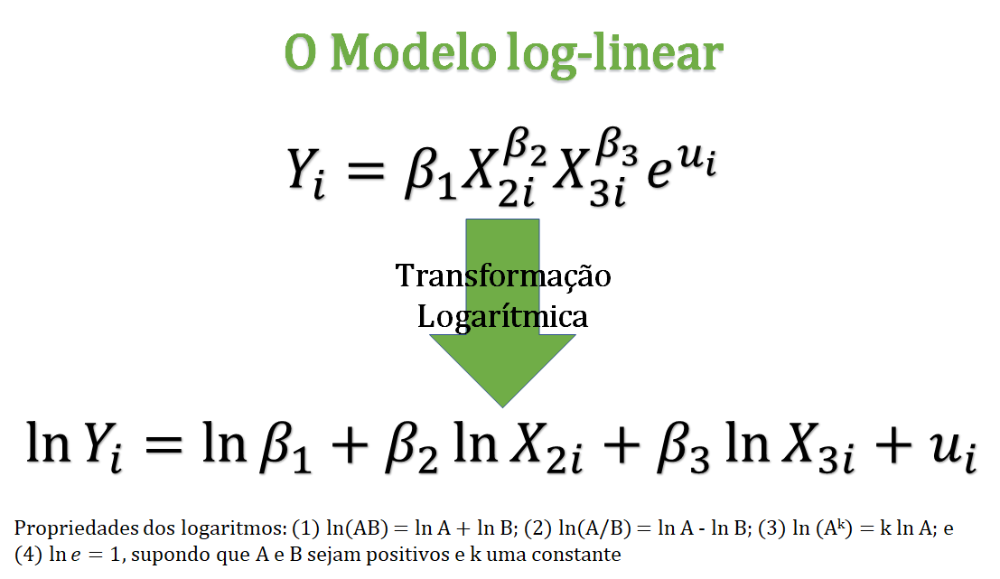

In [ ]:
# Importando a biblioteca statsmodels
import statsmodels.api as sm

# Estimando o modelo com statsmodels
X_train_com_constante = sm.add_constant(X_train)
modelo_statsmodels = sm.OLS(y_train, X_train_com_constante, hasconst=True).fit()

X_train_com_constante

,const,log_bathrooms,log_sqft_living,log_grade,log_sqft_above,log_sqft_living15
8831,1.0,1.098612,7.286192,1.791759,7.286192,7.845416
63,1.0,1.011601,7.339538,2.079442,7.339538,7.365180
6240,1.0,1.504077,7.455877,2.197225,7.207860,7.512071
19643,1.0,1.252763,8.216088,2.197225,8.216088,8.022897
14436,1.0,1.252763,7.506592,1.945910,7.021084,7.177782
...,...,...,...,...,...,...
18904,1.0,0.693147,7.791523,1.945910,7.791523,7.396335
91,1.0,1.321756,8.166216,2.302585,8.166216,7.832014
14036,1.0,0.916291,7.098376,1.945910,7.098376,7.098376
16401,1.0,0.916291,7.414573,1.945910,7.414573,7.402452


In [ ]:
# Avaliando as estatísticas de teste do modelo
print(modelo_statsmodels.summary())

                            OLS Regression Results                            
Dep. Variable:              log_price   R-squared:                       0.463
Model:                            OLS   Adj. R-squared:                  0.463
Method:                 Least Squares   F-statistic:                     2580.
Date:                Sun, 31 Jan 2021   Prob (F-statistic):               0.00
Time:                        11:35:36   Log-Likelihood:                -4937.2
No. Observations:               14961   AIC:                             9886.
Df Residuals:                   14955   BIC:                             9932.
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                        coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------
const                 6.5652      0.07

Valores acima de 0.05 para a a **Aceitação (Prob (F-statisc))**, rejeitamos o modelo, ou seja, ele não é estatisticamente significativo, segundo essa estatística eles são praticamente zero, a regressão não é boa. Se fosse maior que isso nosso modelo precisaria ser revisto.

Da mesma forma, fazemos o teste **t**. **P>|t|** deve ser menor que 0.05 para que o parâmetro seja estatísticamente significativo. Desta forma, todas as variáveis testadas são significativas.

Ou seja:

Teste de significância conjunta dos parâmetros
Prob (F-statistic) <= 0.05 (**OK**)

Teste de significância individual dos parâmetros
P>|t| <= 0.05 (**OK**)

## Estimando o Modelo com os Dados de Treino

In [ ]:
# Importando LinearRegression e metrics da biblioteca scikit-learn
from sklearn.linear_model import LinearRegression
from sklearn import metrics

# Instanciando a classe LinearRegression()
modelo = LinearRegression()

# Utilizando o método fit() do objeto "modelo" para estimar nosso modelo linear utilizando os dados de TREINO (y_train e X_train)
modelo.fit(X_train, y_train);

### Obtendo o coeficiente de determinação (R²) do modelo estimado com os dados de TREINO

Coeficiente de Determinação - R²
O coeficiente de determinação (R²) é uma medida resumida que diz quanto a linha de regressão ajusta-se aos dados. É um valor entra 0 e 1.

$$R^2(y, \hat{y}) = 1 - \frac {\sum_{i=0}^{n-1}(y_i-\hat{y}_i)^2}{\sum_{i=0}^{n-1}(y_i-\bar{y}_i)^2}$$

In [ ]:
print('R² com os dados de TREINO')
print(f'     R² = {modelo.score(X_train, y_train):.3f}')

R² com os dados de TREINO
     R² = 0.463


In [ ]:
# Gerando previsões para os dados de TESTE (X_test) utilizando o método predict() do objeto "modelo"
y_previsto = modelo.predict(X_test)
print('R² para as previsões do nosso modelo')
print(f'       R² = {metrics.r2_score(y_test, y_previsto):.3f}')

R² para as previsões do nosso modelo
       R² = 0.476


## Obtendo Previsões

In [ ]:
# Dados de entrada
entrada = X_test[0:1]
entrada

,log_bathrooms,log_sqft_living,log_grade,log_sqft_above,log_sqft_living15
14110,1.011601,7.528332,2.079442,7.528332,7.251345


In [ ]:
# Gerando previsão pontual
modelo.predict(entrada)[0]

13.01390146827294

In [ ]:
# Invertendo a transformação para obter a estimativa em $
print(f'$ {np.exp(modelo.predict(entrada)[0]).round(2)}')

$ 448606.53


In [ ]:
# Criando um simulador simples

bathrooms = 2
sqft_living = 1860
grade = 8
sqft_above = 1860
sqft_living15 = 1410

entrada = [[np.log(bathrooms + 1), np.log(sqft_living), np.log(grade), np.log(sqft_above), np.log(sqft_living15)]]
print(f'Para os parâmetros selecionados temos que o valor previsto para o imóvel será de ${np.exp(modelo.predict(entrada)[0]):.2f}')

Para os parâmetros selecionados temos que o valor previsto para o imóvel será de $443035.83


## Obtendo o intercepto do modelo
O **intercepto** representa o efeito médio em **Y** (Preço do Imóveis) tendo todas as variáveis explicativas excluídas do modelo. No caso do modelo log-linear este coeficiente deve ser transformado com o uso da função exponencial para ser apresentado em $.

In [ ]:
modelo.intercept_

5.9631670509323484

In [ ]:
print(f'$ {np.exp(modelo.intercept_):.2f}')

$ 388.84


## Obtendo os coeficientes de regressão
Os **coeficientes de regressão** $\beta_2$, $\beta_3$, $\beta_4$, $\beta_5$ e $\beta_6$ são conhecidos como **coeficientes parciais de regressão** ou **coeficientes parciais angulares**.

Um aspecto interessante do modelo log-linear, que o tornou muito utilizado nos trabalhos aplicados, é que os coeficientes angulares $\beta_2$, $\beta_3$, $\beta_4$, $\beta_5$ e $\beta_6$ medem as elasticidades de Y em relação a $X_2$, $X_3$, $X_4$, $X_5$ e $X_6$ isto é, a variação percentual de Y correspondente a uma dada variação percentual (pequena) em $X_2$, $X_3$, $X_4$, $X_5$ e $X_6$.

In [ ]:
modelo.coef_

array([-0.09018084,  0.53617783,  1.52134423, -0.22755774,  0.23076503])

In [ ]:
X.columns

Index(['log_bathrooms', 'log_sqft_living', 'log_grade', 'log_sqft_above',
       'log_sqft_living15'],
      dtype='object')

In [ ]:
# Criando uma lista com os nomes das variáveis do modelo
index = ['Intercepto', 'log(bathrooms)', 'log(sqft_living)', 'log(grade)', 'log(sqft_above)', 'log(sqft_living15)']

# Criando um DataFrame para armazenar os coeficientes do modelo
pd.DataFrame(data=np.append(modelo.intercept_, modelo.coef_), index=index, columns=['Parâmetros'])

,Parâmetros
Intercepto,5.963167
log(bathrooms),-0.090181
log(sqft_living),0.536178
log(grade),1.521344
log(sqft_above),-0.227558
log(sqft_living15),0.230765


Interpretação dos Coeficientes Estimados
Intercepto → Excluindo o efeito das variáveis explicativas ( X2=X3=X4=X5=X6=0 ) o efeito médio no Preço dos Imóveis seria de $ 388.84 (exp[5.963167]).

* **bathrooms** → Mantendo-se as demais variáveis constantes, um acréscimo de 1% na quantidade de banheiros gera, em média, uma **queda de 0.09%** no Preço do Imóvel.
* **sqft_living** → Mantendo-se as demais variáveis constantes, um acréscimo de 1% na área contruída total gera, em média, um **acréscimo de 0.54%** no Preço do Imóvel.
* **grade** → Mantendo-se as demais variáveis constantes, um acréscimo de 1% no nível do imóvel, em média gera, um **acréscimo de 0.54%** no Preço do Imóvel.
* **sqft_above** → Mantendo-se as demais variáveis constantes, um acréscimo de 1% na área contruída acima do solo gera, em média, uma **queda de 0.23%** no Preço do Imóvel.
* **sqft_living15** → Mantendo-se as demais variáveis constantes, um acréscimo de 1% na área contruída dos 15 vizinhos mais próximos gera, em média, um **acréscimo de 0.23%** no Preço do Imóvel.

## Análise Gráfica dos Resultados do Modelo

In [ ]:
# Gerando as previsões do modelo para os dados de TREINO



In [ ]:
import folium
from folium import plugins

In [ ]:
m=folium.Map([47.5538751,-122.1617275],zoom_start=9)

location_dados = dados[['lat', 'long']].to_numpy()
m.add_child(plugins.HeatMap(location_dados, radius=15))
m

In [ ]:
m=folium.Map([47.5538751,-122.1617275],zoom_start=9)

for index, row in dados.iterrows():
     folium.CircleMarker(location=(row['lat'], row['long']),
                         color=row['price'],
                         fill=True,
                         fill_opacity=0.7).add_to(m)
m

In [ ]:
state_geo = 'https://gist.githubusercontent.com/mshafrir/2646763/raw/8b0dbb93521f5d6889502305335104218454c2bf/states_hash.json'

In [ ]:
m=folium.Map([47.5538751,-122.1617275],zoom_start=9)

folium.Choropleth(geo_data=state_geo,
                  name='choropleth',
                  columns = ['price'],
                  fill_color ='YlGnBu',     #I passed colors Yellow,Green,Blue
                  fill_opacity = 0.7,
                  line_opacity = 0.2).add_to(m)

m

In [ ]:
from sklearn.datasets import load_boston

In [ ]:
boston = load_boston()
x = boston.data
y = boston.target
columns = boston.feature_names
#create the dataframe
boston_df = pd.DataFrame(boston.data)
boston_df.columns = columns
boston_df.head()

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT
0,0.00632,18.0,2.31,0.0,0.538,6.575,65.2,4.0900,1.0,296.0,15.3,396.90,4.98
1,0.02731,0.0,7.07,0.0,0.469,6.421,78.9,4.9671,2.0,242.0,17.8,396.90,9.14
2,0.02729,0.0,7.07,0.0,0.469,7.185,61.1,4.9671,2.0,242.0,17.8,392.83,4.03
3,0.03237,0.0,2.18,0.0,0.458,6.998,45.8,6.0622,3.0,222.0,18.7,394.63,2.94
4,0.06905,0.0,2.18,0.0,0.458,7.147,54.2,6.0622,3.0,222.0,18.7,396.90,5.33


In [ ]:
from scipy import stats
import numpy as np


In [ ]:
z = np.abs(stats.zscore(boston_df))
print(z)

[[0.41978194 0.28482986 1.2879095  ... 1.45900038 0.44105193 1.0755623 ]
 [0.41733926 0.48772236 0.59338101 ... 0.30309415 0.44105193 0.49243937]
 [0.41734159 0.48772236 0.59338101 ... 0.30309415 0.39642699 1.2087274 ]
 ...
 [0.41344658 0.48772236 0.11573841 ... 1.17646583 0.44105193 0.98304761]
 [0.40776407 0.48772236 0.11573841 ... 1.17646583 0.4032249  0.86530163]
 [0.41500016 0.48772236 0.11573841 ... 1.17646583 0.44105193 0.66905833]]
